# Introduction

Forest cover type is one of the basic geographical features that is crucial to natural resource industries. In modern geospatial studies, basic geographical data can be now gathered by highly-efficient remote-sensing technologies such as satellites, or it can be gathered on-site during field studies. However, occasionally, the two methods listed above can be inefficient in time and cost, and their execution may require permission from property owners or management agencies.

An alternative to acquire forest cover type data is by predicting the information from cartographic variables generated by some Geographic Information System (GIS). A research conducted by Jock A. Blackard and Denis J. Dean ([DOI: 10.1016/S0168-1699(99)00046-0](https://www.sciencedirect.com/science/article/pii/S0168169999000460)), published on *Computers and Electronics in Agriculture 24 (1999) 131-151*, derived an artificial neural network model using software PROPAGATOR (version 1.0, ARD Corp., 1993) for feedforward ANN and SAS (version 6.11, SAS Inst. Inc., 1989) to predict forest cover type based on cartographic variables only. 

The dataset used in the research is provided primarily by U.S. Geological Survey (USGS) and U.S. Forest Survey (USFS). The dataset includes cartographic variables such as elevation, aspect, slope, distance to hydrology, distance to road, soil type, hillshade at various time of day, etc. The elevation data is obtained from USGS Digital Elevation Model (DEM) data for the 3D Elevation Program (3DEP). This 3D model generates precise elevation information based on measurements gathered by lidar mapping, a type of early remote-sensing techniques using laser light to densely sample the Earth's surface. Most of the other cartographic data is derived using GIS-based surface analysis and hillshading procedures based on the elevation data. 

The wilderness areas of Roosevelt National Forest in Colorado, which is described by the dataset, is subject to little human interference, and thus the dataset reflects forest cover type patterns formed solely under ecological factors. However, due to the technological limitations in the late 1990s, the ANN developed in Blackard and Dean's research only achieved an accuracy of 70% - 71%. In the following, the feature analysis of the dataset is conducted using Scikit-learn, and several statistical models and ANN models are explored using Scikit learn and Tensorflow in search of the best performing model that predicts the forest cover type based on cartographic information only. Specifically, for feature selection, classifiers including Extra Tree, Gradient Boost, Random Forest, XGBoost, Recursive Feature Elimiation, and Select Percentile are used to create subsets and combinations of features for model training. On the other side, statistical and machine learning classsification models including Linear Discriminant, Logistic Regression, K Nearest Neighbours, Gaussian Naïve Bayes, Decision Tree, Support Vector Machine, Random Forest, Extra Trees, AdaBoost, Bagging, Voting, XGB Classifier, and an ANN deep learning model are developed. Eventually, after comparison, it is determined that the Extra Trees Classifier is the best performing model with an accuracy of approximately 87%.

For more dataset information, please refer to [UCI Machine Learning repository](https://archive.ics.uci.edu/ml/datasets/covertype).

# Data Cleaning

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [2]:
trainDF = pd.read_csv("train.csv")
print(trainDF.head())
print(trainDF.describe())

   Id  Elevation  Aspect  Slope  Horizontal_Distance_To_Hydrology  \
0   1       2596      51      3                               258   
1   2       2590      56      2                               212   
2   3       2804     139      9                               268   
3   4       2785     155     18                               242   
4   5       2595      45      2                               153   

   Vertical_Distance_To_Hydrology  Horizontal_Distance_To_Roadways  \
0                               0                              510   
1                              -6                              390   
2                              65                             3180   
3                             118                             3090   
4                              -1                              391   

   Hillshade_9am  Hillshade_Noon  Hillshade_3pm  ...  Soil_Type32  \
0            221             232            148  ...            0   
1            220          

It can be observed that the ID column is solely indicating the data instances, and can thus be omitted. Also, notice the soil_type7 and 15 only have a single unique value and thus can be removed.

In [3]:
trainDF.drop(['Id', 'Soil_Type7', 'Soil_Type15'], axis = 1, inplace = True)

# Exploratory Data Analysis

In order to observe the continuous cartographic variables and their correlations, the discrete data columns are temporarily eliminated, and the pairs of columns with high correlation are filtered. 

First, observe the following heatmap.

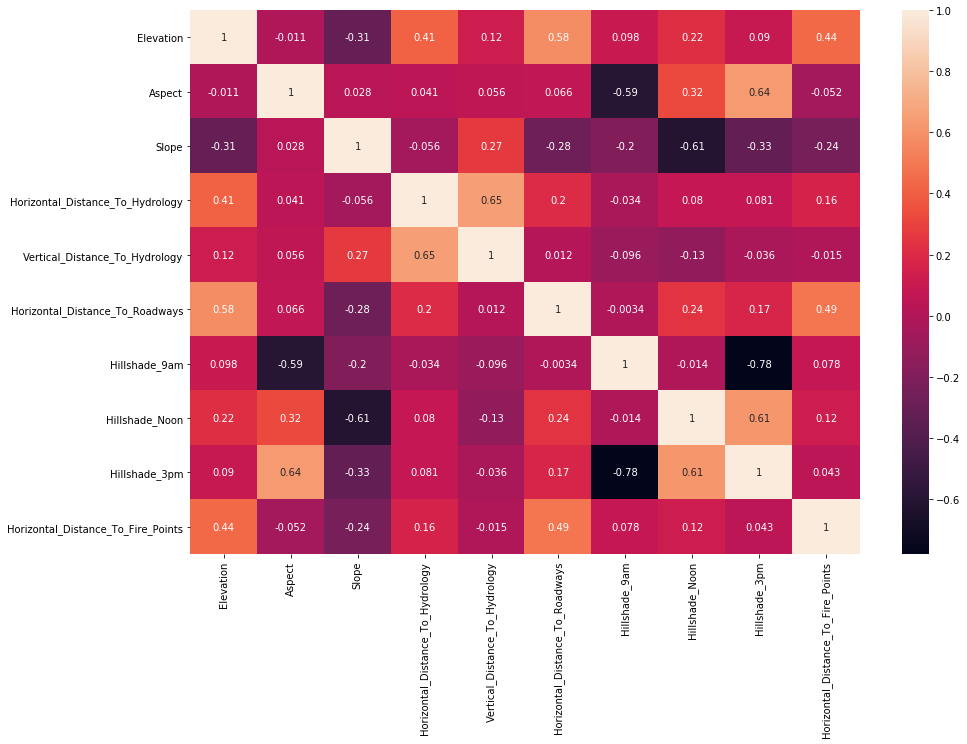

In [4]:
corrDF = trainDF.iloc[:, :10]

plt.figure(figsize = (15, 10))
sns.heatmap(corrDF.corr(), annot=True)

Next, in a programmatic way, observe the highly correlated columns.

In [5]:
highCorrList =[]
corrDFCorr = corrDF.corr()
columns = corrDF.columns

for i in range(0, 10):
    for j in range(i+1, 10):
        tempCorr = corrDFCorr.iloc[i, j]
        if (tempCorr >= 0.5 and tempCorr < 1) or (tempCorr < 0 and tempCorr <= -0.5):
            highCorrList.append([tempCorr, i, j])

highCorrList = sorted(highCorrList, key=lambda x: -abs(x[0]))

for x, y, z in highCorrList:
    print("{0} , {1} : {2}".format(columns[y], columns[z], x))

Hillshade_9am , Hillshade_3pm : -0.779964742447544
Horizontal_Distance_To_Hydrology , Vertical_Distance_To_Hydrology : 0.6521424712357364
Aspect , Hillshade_3pm : 0.635022364019874
Hillshade_Noon , Hillshade_3pm : 0.6145263872475779
Slope , Hillshade_Noon : -0.6126128724172692
Aspect , Hillshade_9am : -0.5939974281313112
Elevation , Horizontal_Distance_To_Roadways : 0.5786589907340067


The highly correlated pairs may be reduced in the feature set through transformations such as Principal Component Analysis (PCA). Their relationships are further explored in the following scatterplots.

<Figure size 864x720 with 0 Axes>

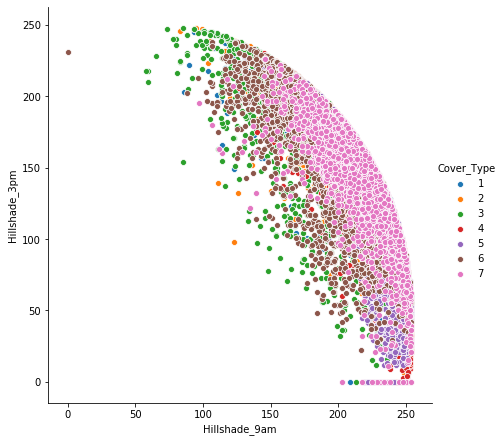

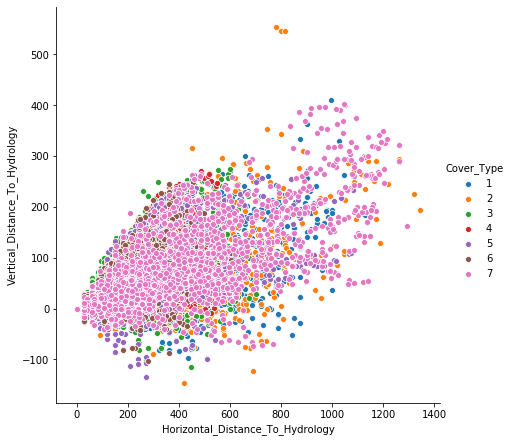

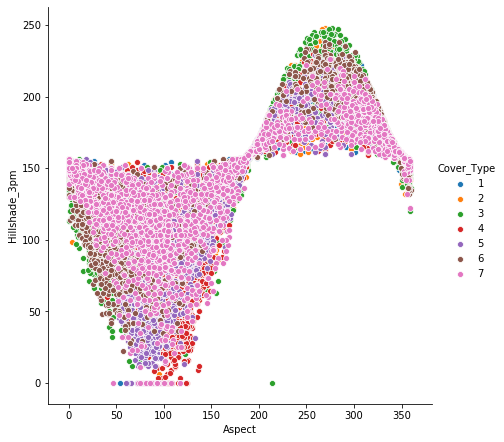

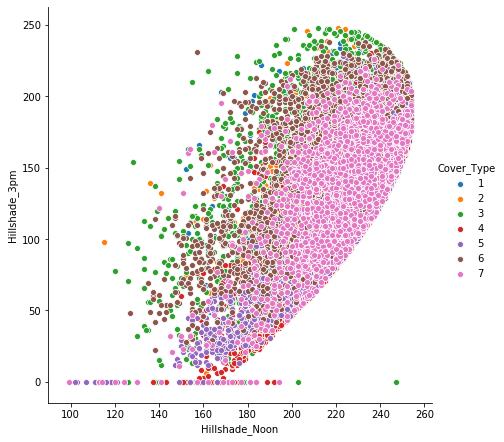

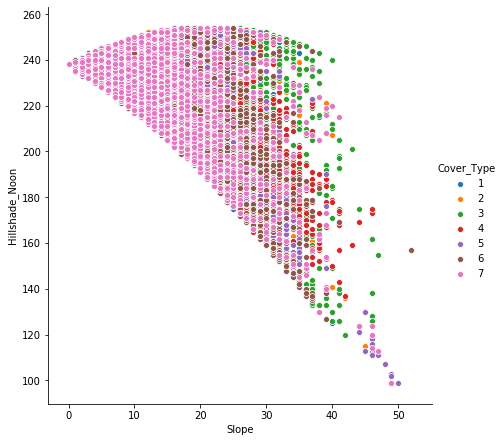

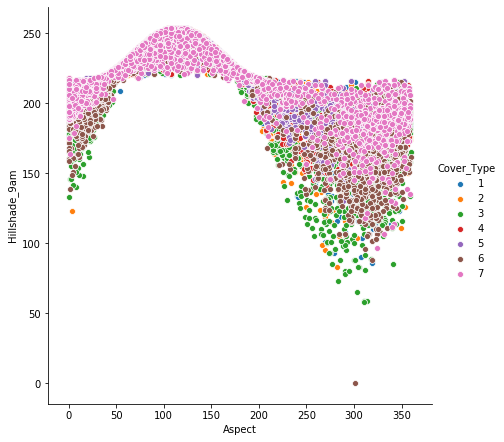

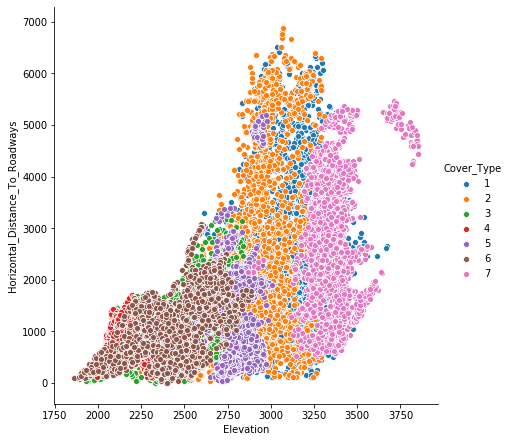

In [6]:
plt.figure(figsize=(12, 10))

for corr in highCorrList:
    sns.pairplot(trainDF, hue="Cover_Type", size = 6, x_vars=columns[corr[1]], y_vars=columns[corr[2]])

It can be observed that
- in plot 2, horizontal and vertical distace to hydrology forms nearly a linear relationship
- in plot 3, aspect and hillshade forms a near sigmoid relationship.

Next, encode the discrete binary columns to a single category column by iterating throught the dataset columns.

In [7]:
# Construct an empty dataframe to store encoded data
encodeDF = pd.DataFrame(index=np.arange(0, trainDF.shape[0]-2), columns=['Wilderness_Area', 'Soil_Type', 'Cover_Type'])
trainDF['Wilderness_Area'] = trainDF['Wilderness_Area1']
trainDF['Soil_Type'] = trainDF['Soil_Type1']

# Iterate through the dataset rows
for index, row in trainDF.iterrows():
    for i in range (10, 14):
        if (row[i] == 1):
            row[53] = i - 9
            break
    
    for j in range (14, 52):
        if (row[j] == 1):
            row[54] = j - 13
            break

# Copy the data over to the empty dataframe, and clean up.
encodeDF['Cover_Type'] = trainDF['Cover_Type']
encodeDF['Soil_Type'] = trainDF['Soil_Type']
encodeDF['Wilderness_Area'] = trainDF['Wilderness_Area']
trainDF.drop(['Wilderness_Area', 'Soil_Type'], axis = 1, inplace=True)

Display the info of Wilderness Area, and Soil Type in countplots with hue of forest cover type in order to examine if the feature is strong.

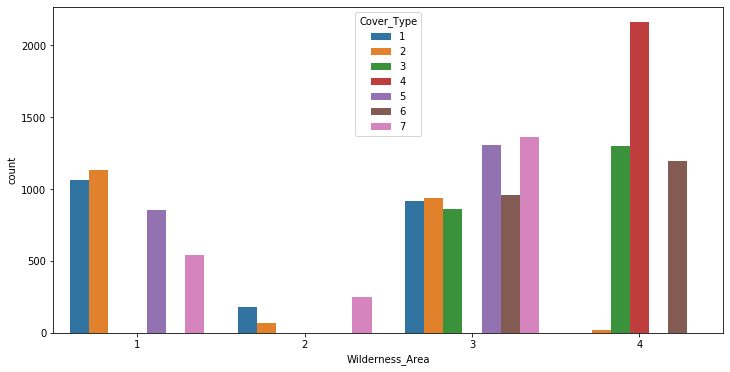

In [8]:
plt.figure(figsize = (12, 6))
sns.countplot(x = 'Wilderness_Area', hue = 'Cover_Type', data = encodeDF)

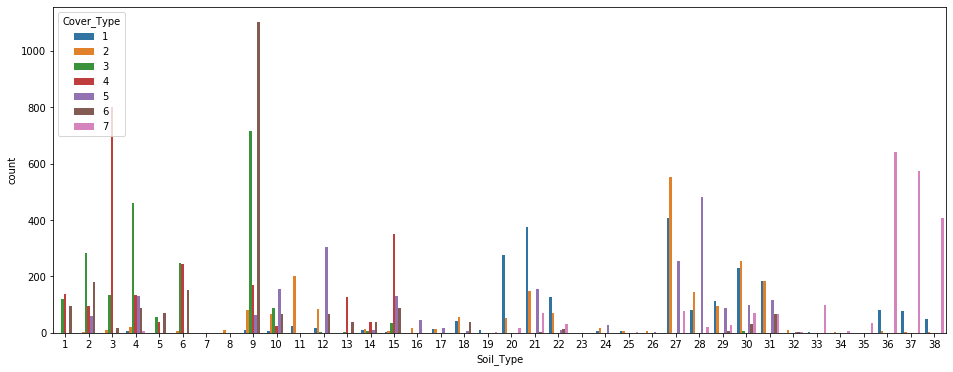

In [9]:
plt.figure(figsize = (16, 6))
sns.countplot(x = 'Soil_Type', data=encodeDF, hue = 'Cover_Type')

In general, 
- wilderness area 3 has its cover type very averaged, so it is not a good class distinction.
- wilderness area 4 has a great count in cover type 4, offering good class distinction.
- Soil type 1-6, 10-14, 17, 22, 23, 29-33, 35, 38-40 all offer good class distinction.

# Data Preprocessing

In [10]:
from sklearn.model_selection import train_test_split
X = trainDF.drop('Cover_Type', axis=1)
y = trainDF['Cover_Type']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0)

Since all columns are non-null, there is no need to impute values.
Next, in order to use the best preprocessing method, each of the three common preprocessing methods (StandardScalar, MinMaxScaler, Normalizer) are attempted and the resulting training data is stored individually. 

In [11]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer

r, c = trainDF.shape
featSelectedIdx = []
for i in range(0,c-1):
    featSelectedIdx.append(i)

featureGroupSubsets = []
featureGroups = []
featureGroups.append("All+1.0")
featureLst = []
# Transformation, Name, XTrain, XTest, Ratio, 
# featSelected, featRemoved, featImportanceRank, featSelectedIdx, featRemovedIdx
featureLst.append(['Original','All', X_train.to_numpy(), X_test.to_numpy(), 1.0, trainDF.columns[:c-1], [], [], featSelectedIdx, []])

#Standardized
X_train_temp = StandardScaler().fit_transform(X_train.iloc[:,0:10])
X_test_temp = StandardScaler().fit_transform(X_test.iloc[:,0:10])
X_train_concat = np.concatenate((X_train_temp, X_train.iloc[:,10:]), axis=1)
X_test_concat = np.concatenate((X_test_temp, X_test.iloc[:,10:]), axis=1)
featureLst.append(['StandardScaler','All', X_train_concat, X_test_concat, 1.0, trainDF.columns, [], [], featSelectedIdx, []])

#MinMax
X_train_temp = MinMaxScaler().fit_transform(X_train.iloc[:,0:10])
X_test_temp = MinMaxScaler().fit_transform(X_test.iloc[:,0:10])
X_train_concat = np.concatenate((X_train_temp, X_train.iloc[:,10:]), axis=1)
X_test_concat = np.concatenate((X_test_temp, X_test.iloc[:,10:]), axis=1)
featureLst.append(['MinMaxScaler','All', X_train_concat, X_test_concat, 1.0, trainDF.columns, [], [], featSelectedIdx, []])

#Normalize
X_train_temp = Normalizer().fit_transform(X_train.iloc[:,0:10])
X_test_temp = Normalizer().fit_transform(X_test.iloc[:,0:10])
X_train_concat = np.concatenate((X_train_temp, X_train.iloc[:,10:]), axis=1)
X_test_concat = np.concatenate((X_test_temp, X_test.iloc[:,10:]), axis=1)
featureLst.append(['Normalizer','All', X_train_concat, X_test_concat, 1.0, trainDF.columns, [], [], featSelectedIdx, []])

#List of transformations
transformationLst = []
for feature in featureLst:
    transformationLst.append(feature[0])

# Feature Selection

### Extra Tree, Gradient Boosting, Random Forest, XGB

Next, in order to use the best feature selection classifier and to use the best number of features, each of the four common feature selection classifiers (Extra Tree, Gradient Boosting, Random Forest, XGB) is combined with 1/4, 1/2 and 3/4 of all features to form feature groups. 

In [12]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

ratios = [0.25, 0.50, 0.75]
model_names = []
model_lst = []

model_names.append('ExtraTree')
for ratio in ratios:
    featureGroups.append("ExtraTree+%s" % ratio)
    model_lst.append(['ExtraTree', ratio, 
                      ExtraTreesClassifier(n_estimators=c-1,max_features=ratio, n_jobs=-1, random_state=0)])      


model_names.append('GradientBoost')
for ratio in ratios:
    featureGroups.append("GradientBoost+%s" % ratio)
    model_lst.append(['GradientBoost',ratio,GradientBoostingClassifier(n_estimators=c-1,max_features=ratio,random_state=0)])   


model_names.append('RandomForest')
for ratio in ratios:
    featureGroups.append("RandomForest+%s" % ratio)
    model_lst.append(['RandomForest',ratio,RandomForestClassifier(n_estimators=c-1,max_features=ratio,n_jobs=-1,random_state=0)])   

#Add XGBClassifier to the list 
model_names.append('XGBoost')
for ratio in ratios:
    featureGroups.append("XGBoost+%s" % ratio)
    model_lst.append(['XGBoost',ratio,XGBClassifier(n_estimators=c-1,seed=0)])   

Next, equipped with a list of preprocessed data and a list of feature selection classifier models with various ratios, the models are now run and the highly-ranked important features are filtered out.

In [13]:
for transform, name, XTrain, XTest, ratio, featSelected, featRemoved, featRank, featSelectedIdx, featRemovedIdx in featureLst:
    for modelName, modelRatio, model in model_lst:
        
        # Train the model
        model.fit(XTrain, y_train)
        
        # Combine importance and index of the column in the array joined
        joined = []
        for i, pred in enumerate(list(model.feature_importances_)):
            joined.append([i, featSelected[i], pred])
        joined = sorted(joined, key=lambda x: -x[2])
        
        # Compute the rank value threshold to consider as important feature
        threshold = int((modelRatio*(c-1)))        
        colSelected = [] # selected cols, ranked
        colSelectedIdx = [] 
        colRank = [] # ranked all cols
        colRemoved = [] # removed cols, ranked
        colRemovedIdx = []

        # filter out the highly ranked/important features
        for j, (i, col, x) in enumerate(list(joined)):
            colRank.append([i,j])
            
            if(j < threshold):
                colSelected.append(col)
                colSelectedIdx.append(i)
            else:
                colRemoved.append(col)
                colRemovedIdx.append(i)    
                
        # Store in the subset
        featureGroupSubsets.append([transform, modelName, XTrain, XTest, modelRatio, 
                                    colSelected, colRemoved,
                                    [x[1] for x in sorted(colRank, key=lambda x:x[0])], 
                                    colSelectedIdx, colRemovedIdx])    


The following plots are used to illustrate the rank of the features' importance. Specifically, the lower the rank, the more important the feature is.

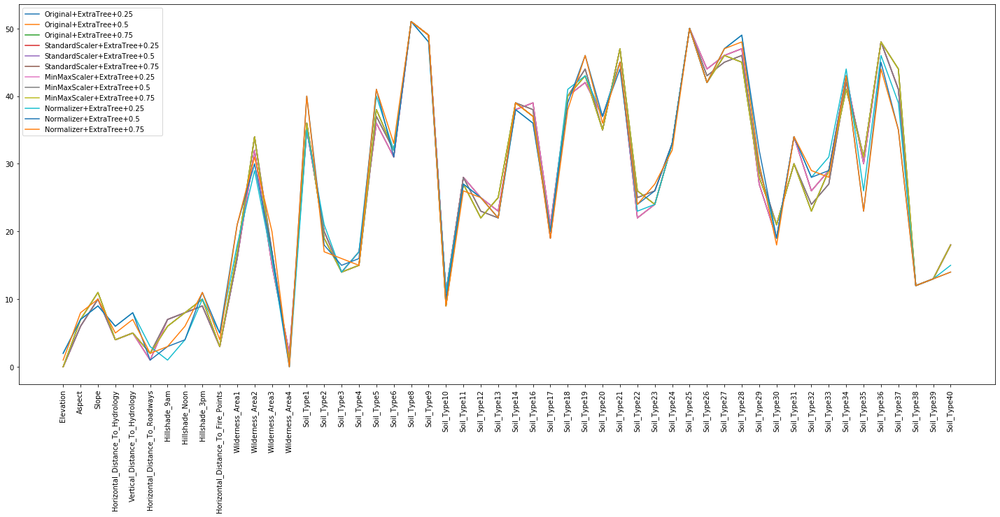

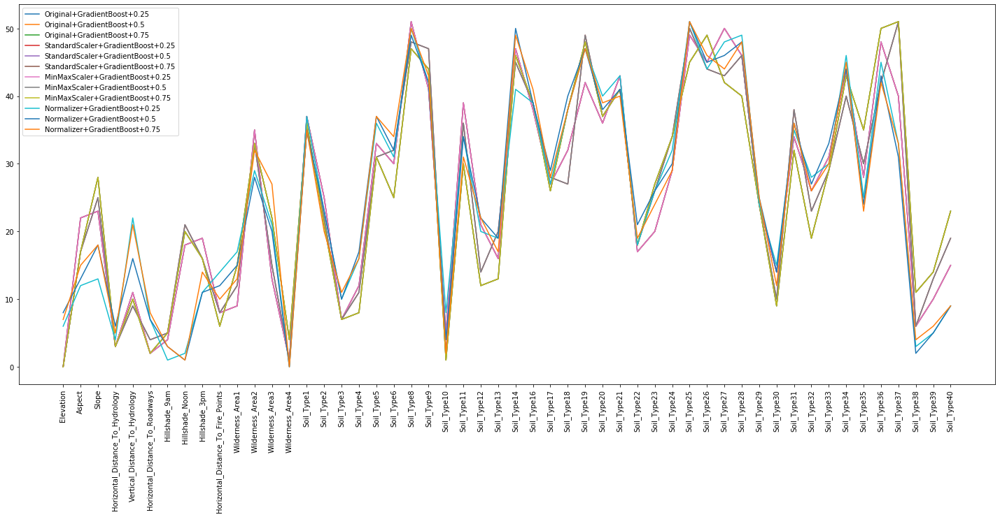

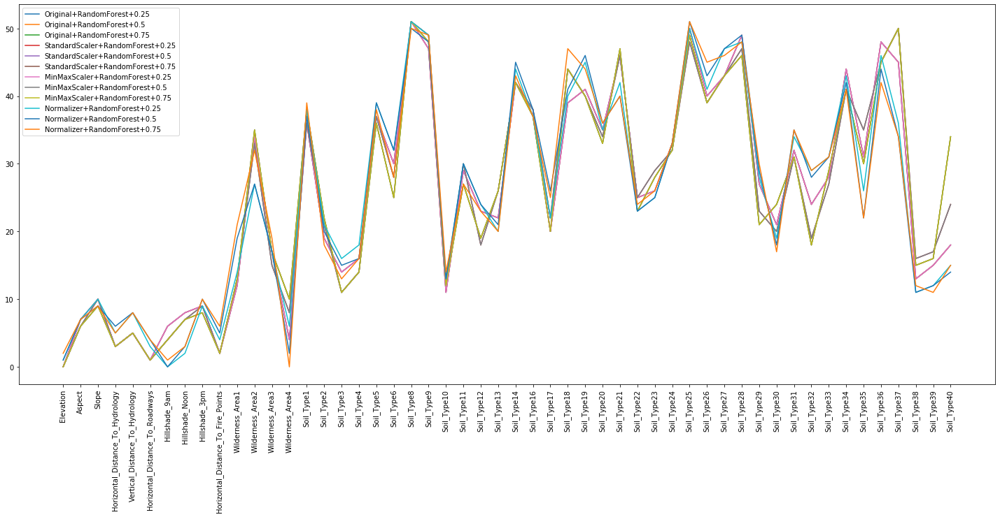

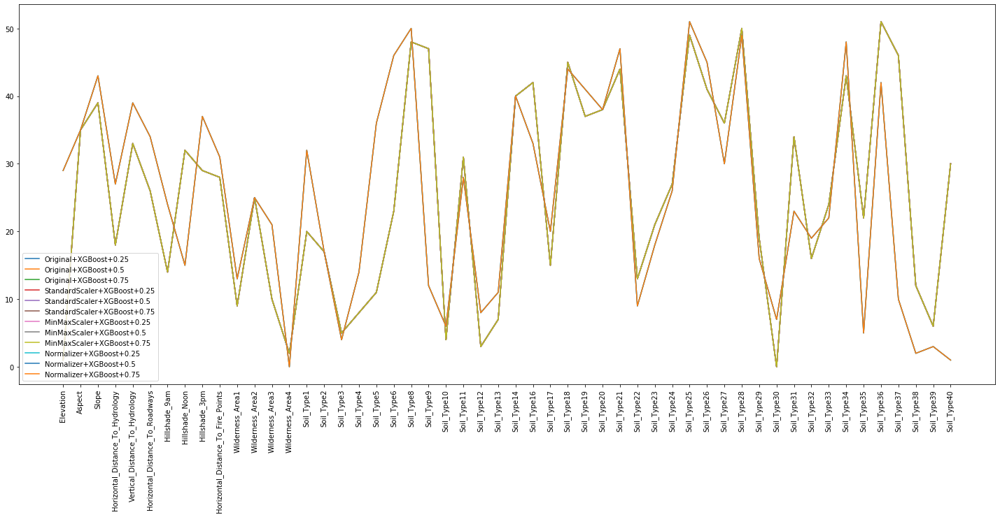

In [14]:
plt.rc("figure", figsize=(25, 10))
    
for model in model_names:
    legends = []
    fig, ax = plt.subplots()
    for transform, name, XTrain, XTest, ratio, colSelected, colRemoved, colRank, colSelectedIdx, colRemovedIdx in featureGroupSubsets:

        if(model == name):
            plt.plot(colRank)
            legends.append(transform + '+' + model + '+%s'%ratio)

    ax.set_xticks(range(c-1))
    ax.set_xticklabels(trainDF.columns[:c-1],rotation='vertical')

    plt.legend(legends, loc='best')
    
    plt.show()

### Recursive Feature Elimination

Another feature selection method -- the Recursive Feature Elimination (RFE) classifier, is attemped in a similar fashion. First, the RFE model is declared, and it is combined with various feature groups.

In [15]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

models = []
model_names = []

model = LogisticRegression(random_state=0, n_jobs=-1)

model_names.append('RFE')
for ratio in ratios:
    featureGroups.append("RFE+%s" % ratio)
    models.append(['RFE', ratio, RFE(model, ratio*(c-1))])   

Run the model and filter out the highly ranked features in every group.

In [16]:
for transform, name, XTrain, XTest, ratio, featSelected, featRemoved, featRank, featSelectedIdx, featRemovedIdx in featureLst:
    for modelName, modelRatio, model in models:
        
        # Train the model
        model.fit(XTrain, y_train)
        
        # Combine importance and index of the column in the array joined
        joined = []
        for i, prediction in enumerate(list(model.ranking_)):
            joined.append([i, featSelected[i], prediction])
        joined = sorted(joined, key=lambda x: x[2])
        
        # Compute the amount of highly ranked features to be kept
        remove_start = int(modelRatio * (c - 1))
        col_selected = []
        col_selected_idx = []
        col_ranks =[]
        col_remove = []
        col_remove_idx = []
        
        # filter out the highly ranked/important features
        for i, col, j in joined:
            col_ranks.append([i,j-1])
            
            if((j-1) < remove_start):
                col_selected.append(col)
                col_selected_idx.append(i)
            else:
                col_remove.append(col)
                col_remove_idx.append(i)        
        featureGroupSubsets.append([transform, modelName, XTrain, XTest, 
                                    modelRatio, col_selected, col_remove,
                                    [x[1] for x in sorted(col_ranks,key=lambda x:x[0])],
                                    col_selected_idx, col_remove_idx])    

The following plot demonstrates the rank of the features' importance based on the RFE classifier. Similar to the previous example, the lower the rank, the more important the feature is.

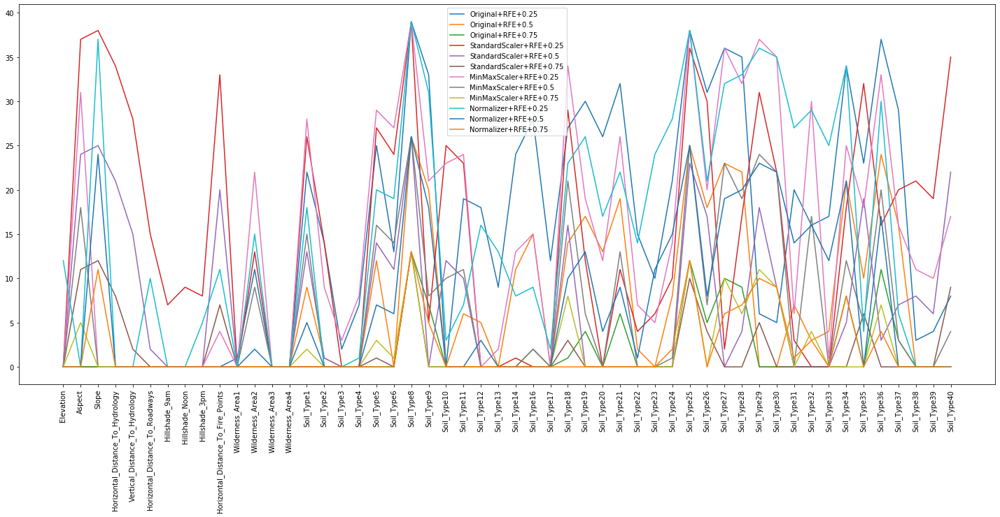

In [17]:
plt.rc("figure", figsize=(25, 10))
    
for model in model_names:
    legends = []
    fig, ax = plt.subplots()
    for transform, name, XTrain, XTest, ratio, colSelected, colRemoved, colRank, colSelectedIdx, colRemovedIdx in featureGroupSubsets:

        if(model == name):
            plt.plot(colRank)
            legends.append(transform + '+' + model + '+%s'%ratio)

    ax.set_xticks(range(c-1))
    ax.set_xticklabels(trainDF.columns[:c-1],rotation='vertical')

    plt.legend(legends, loc='best')
    
    plt.show()

### Select Percentile

In addition, features can be selected based on a percentile of the highest score. The Sklearn SelectPercentile model is thus attemped, in a similar approach as the previous ones.

In [18]:
from sklearn.feature_selection import SelectPercentile
from sklearn.feature_selection import f_classif     

models = []
model_names = []
   
model_names.append('SelectPercentile')
for ratio in ratios:
    featureGroups.append("SelectPercentile+%s" % ratio)
    models.append(['SelectPercentile', ratio, SelectPercentile(score_func=f_classif,percentile=ratio*100)])

Run the model and filter out the highly ranked features in every group.

In [19]:
for transform, name, XTrain, XTest, ratio, featSelected, featRemoved, featRank, featSelectedIdx, featRemovedIdx in featureLst:
    for modelName, modelRatio, model in models:
        
        # Train the model
        model.fit(XTrain, y_train)
             
        # Combine importance and index of the column in the array joined
        joined = []
        for i, pred in enumerate(list(model.scores_)):
            joined.append([i,featSelected[i],pred])
        joined = sorted(joined, key=lambda x: -x[2])
        
        # Compute the amount of highly ranked features to be kept
        remove_start = int(modelRatio * (c - 1))
        col_selected = []
        col_selected_idx = []
        col_ranks =[]
        col_remove = []
        col_remove_idx = []
        
        # filter out the highly ranked/important features
        for j, (i, col, x) in enumerate(list(joined)):
            col_ranks.append([i,j])
            
            if(j < remove_start):
                col_selected.append(col)
                col_selected_idx.append(i)
            else:
                col_remove.append(col)
                col_remove_idx.append(i)    
       
        featureGroupSubsets.append([transform, modelName,
                                    XTrain, XTest, modelRatio,
                                    col_selected, col_remove,
                                    [x[1] for x in sorted(col_ranks,key=lambda x:x[0])],
                                    col_selected_idx, col_remove_idx])    

The following plot demonstrates the rank of the features' importance based on their percentile scores. Similar to the previous example, the lower the rank, the more important the feature is.

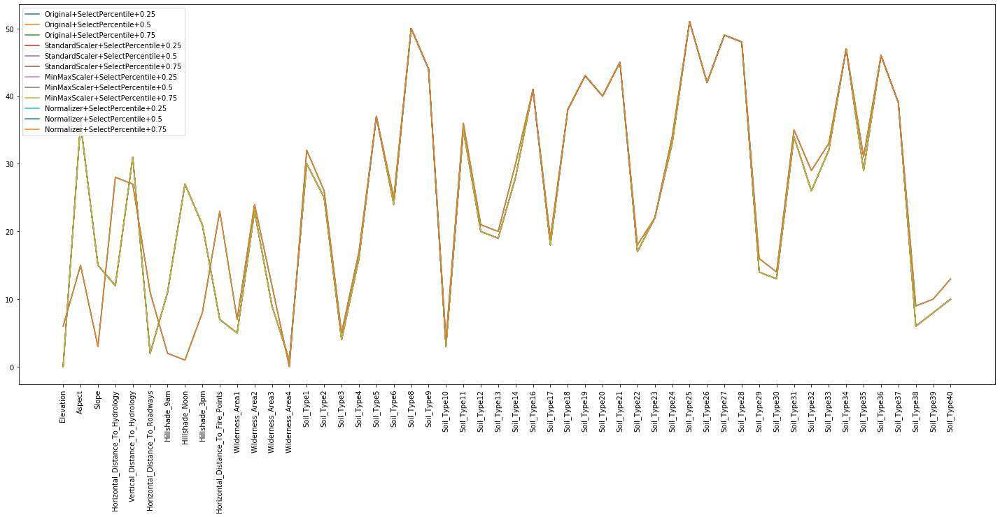

In [20]:
plt.rc("figure", figsize=(25, 10))
    
for model in model_names:
    legends = []
    fig, ax = plt.subplots()
    for transform, name, XTrain, XTest, ratio, colSelected, colRemoved, colRank, colSelectedIdx, colRemovedIdx in featureGroupSubsets:

        if(model == name):
            plt.plot(colRank)
            legends.append(transform + '+' + model + '+%s'%ratio)

    ax.set_xticks(range(c-1))
    ax.set_xticklabels(trainDF.columns[:c-1],rotation='vertical')

    plt.legend(legends, loc='best')
    
    plt.show()

Lastly, the features are ranked based on the median of their ranks over all Feature Selection methods attempted above.

In [21]:
rankDF = pd.DataFrame(data=[x[7] for x in featureGroupSubsets],columns=trainDF.columns[:c-1])
medians = rankDF.median()
print(medians)

Elevation                              0.0
Aspect                                15.0
Slope                                 14.0
Horizontal_Distance_To_Hydrology       4.0
Vertical_Distance_To_Hydrology         9.0
Horizontal_Distance_To_Roadways        2.0
Hillshade_9am                          5.0
Hillshade_Noon                         8.0
Hillshade_3pm                         10.0
Horizontal_Distance_To_Fire_Points     7.0
Wilderness_Area1                      10.5
Wilderness_Area2                      26.0
Wilderness_Area3                      14.0
Wilderness_Area4                       1.0
Soil_Type1                            33.5
Soil_Type2                            20.0
Soil_Type3                             6.0
Soil_Type4                            14.0
Soil_Type5                            36.0
Soil_Type6                            25.0
Soil_Type8                            50.0
Soil_Type9                            45.5
Soil_Type10                            4.0
Soil_Type11

In conclusion, after attempting feature selection models such as Extra Tree, Gradient Boost, Random Forest, XGBoost, Recursive Feature Estimation with Logistic Regression, and Select Percentile, the median of each feature's importance ranks is computed, and it is observed that:
- Elevation, Wilderness Area 4, Soil Type 10/Horizontal Distance to Hydrology are the top three important features for the dataset, respectively.
- Soil Type features are generally less useful than other basic geographic features and wilderness area categories. 

When selecting a limited amount of features or when certain feautures cannot be acquired, the top-ranked features can be prioritized to better predict the forest cover type. As all the features are available in this project, various machine learning models are developed and trained using subsets of available features to better predict the desired feature.

# Machine Learning Models

### Data Preparation

A similar approach is used to set up a set of combations of models, features groups, and preprocessed training data for every ML model to attempt. 

In [22]:
unsortedFeatRank = medians.array
featModels = []

for ratio in ratios:
    featModels.append(['Median', ratio])   

for transform, name, XTrain, XTest, ratio, featSelected, featRemoved, featRank, featSelectedIdx, featRemovedIdx in featureLst:
    for featName, featRatio in featModels:
        
        # Combine/match the selected features with the ranked features
        joined = []
        for i, pred in enumerate(unsortedFeatRank):
            joined.append([i, featSelected[i], pred])  
        joined = sorted(joined, key=lambda x: x[2])
        
        remove_start = int((featRatio*(c-1)))
        col_selected = []
        col_selected_idx = []
        col_ranks =[]
        col_remove = []
        col_remove_idx = []
        
        # Again, select the top ranked features based on the median list derived and the ratio to be selected.
        for j, (i, col, x) in enumerate(list(joined)):
            col_ranks.append([i,j])
            
            if(j < remove_start):
                col_selected.append(col)
                col_selected_idx.append(i)
            else:
                col_remove.append(col)
                col_remove_idx.append(i)           
        featureGroupSubsets.append([transform, featName, XTrain, XTest, featRatio, 
                                    col_selected, col_remove,
                                    [x[1] for x in sorted(col_ranks, key=lambda x:x[0])],
                                    col_selected_idx, col_remove_idx])        

Set up a dictionary to store the accuracies of each ML model for later comparison.

In [23]:
xtickLst = []
accuracies = {}
for transform in transformationLst:
    accuracies[transform]=[]
    accuracies[transform + ' Record'] = []

Next, various statistical models and an Artificial Neural Network (ANN) model is implemented and trained to predict on the given training dataset. First, a general model training and running function is setup for statistical models to run on the set of combations of models, features groups, and preprocessed training data.

In [24]:
def runModel(model, algoName):
    # From original feature list
    for transform, name, XTrain, XTest, ratio, featSelected, featRemoved, featRank, featSelectedIdx, featRemovedIdx in featureLst:
        model.fit(XTrain[:,featSelectedIdx], y_train)
        result = model.score(XTest[:,featSelectedIdx], y_test)
        accuracies[transform].append(result)
        tickLabel = "%s+ALL of %s: %s" % (algoName, ratio, name)
        xtickLst.append(tickLabel)
        accuracies[transform + ' Record'].append(tickLabel)
    
    # from the subset of the best ranked features
    for transform, name, XTrain, XTest, ratio, featSelected, featRemoved, featRank, featSelectedIdx, featRemovedIdx in featureGroupSubsets:
        model.fit(XTrain[:,featSelectedIdx], y_train)
        result = model.score(XTest[:,featSelectedIdx], y_test)
        accuracies[transform].append(result)
        tickLabel = "%s+Subset of %s: %s" % (algoName, ratio, name)
        xtickLst.append(tickLabel)
        accuracies[transform + ' Record'].append(tickLabel)

Also, a graphing function is defined for convenience.

In [25]:
def showPlot():
    plt.rc("figure", figsize=(25, 10))
    
    fig, ax = plt.subplots()
    for transform in transformationLst:
           plt.plot(accuracies[transform])
    
    # Get unique values in all xticks while preserving order.
    ticks = [x for i, x in enumerate(xtickLst) if i == xtickLst.index(x)]
    ax.set_xticks(range(len(ticks)))
    ax.set_xticklabels(ticks, rotation='vertical')
    plt.legend(transformationLst,loc='best')    

    plt.show()    

### Linear Discriminant Analysis (LDA)

Similar to Principal Component Analysis (PCA), LDA tries to reduce dimension and classify categories by maximizing the difference between the categories' means and minimizing their variation. 

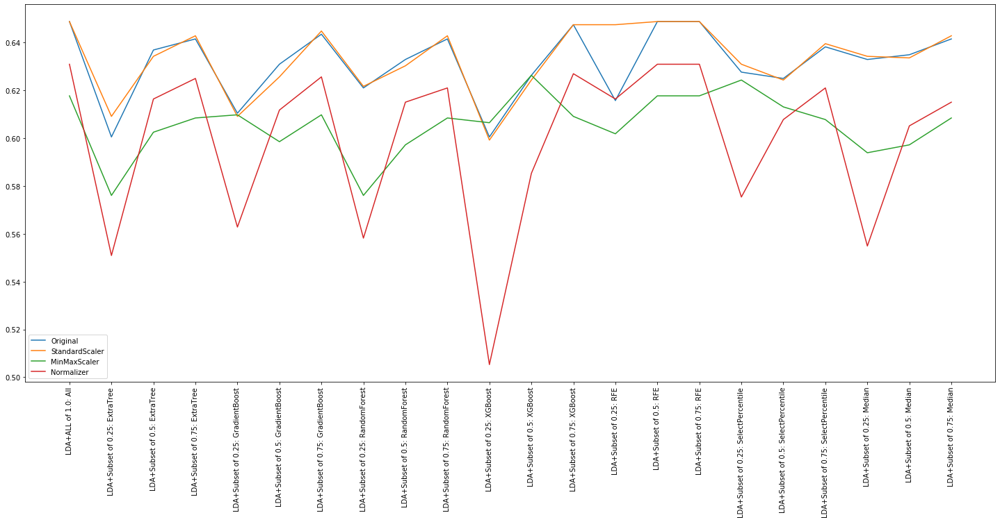

In [26]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

runModel(LinearDiscriminantAnalysis(), 'LDA')
showPlot()

It can be observed that the best performance in LDA is around 0.65-0.66 accuracy/score using Standard Scalar transformation. Also notice that the sets transformed by MinMax Scalar and Normalizer perform worse than others.  

### Logistic Regression

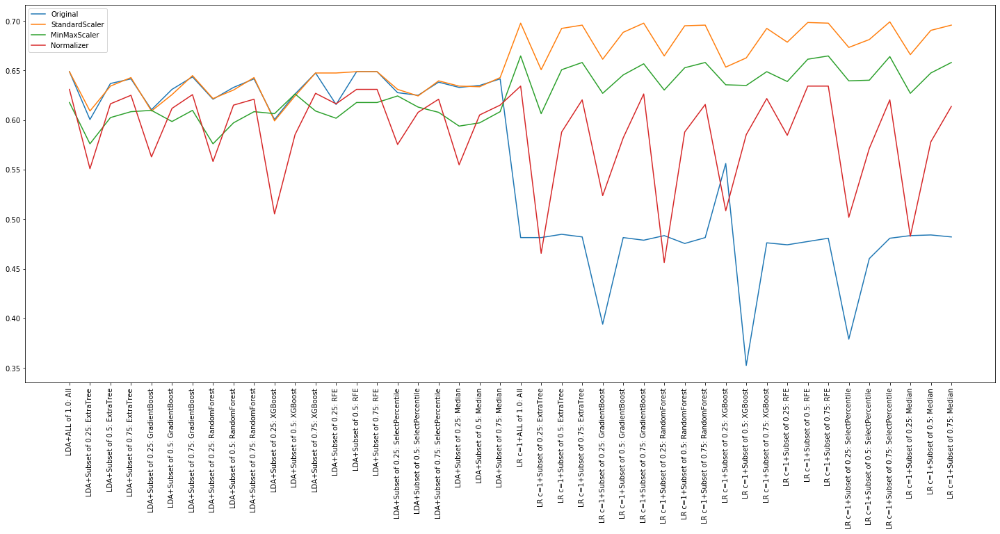

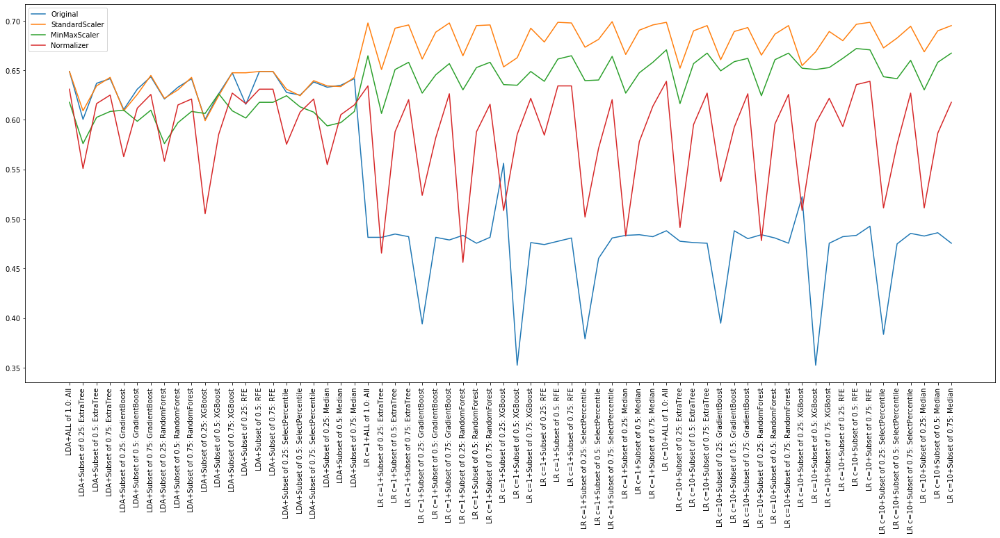

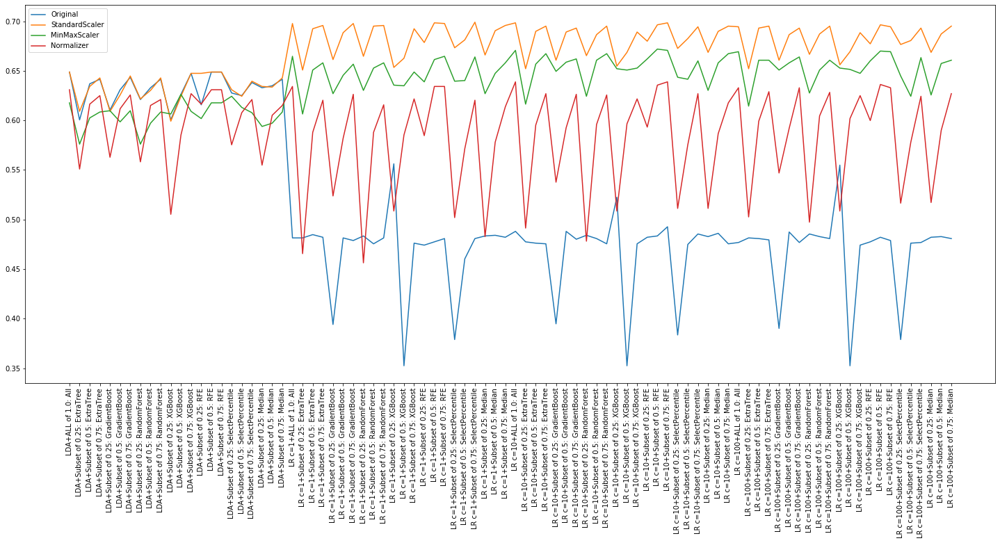

In [27]:
from sklearn.linear_model import LogisticRegression

regularizationLst = [1, 10, 100]
for regularization in regularizationLst:
    runModel(LogisticRegression(n_jobs=-1, random_state=0, C=regularization), 'LR c=%s' %regularization)
    showPlot()

Note that 
- All three of the regularization coefficients' performances are similar. 
- Standard Scalar out-performs all the other transformation methods.
- The best performance of LR is around 70%, better than that of LDA.

Before continuing, the current data is copied over since the plot is already quite filled.

In [28]:
accuraciesTotal = accuracies
xtickLstTotal = xtickLst

xtickLst = []
accuracies = {}
for transform in transformationLst:
    accuracies[transform]=[]
    accuracies[transform + ' Record'] = []

### K Nearest Neighbors

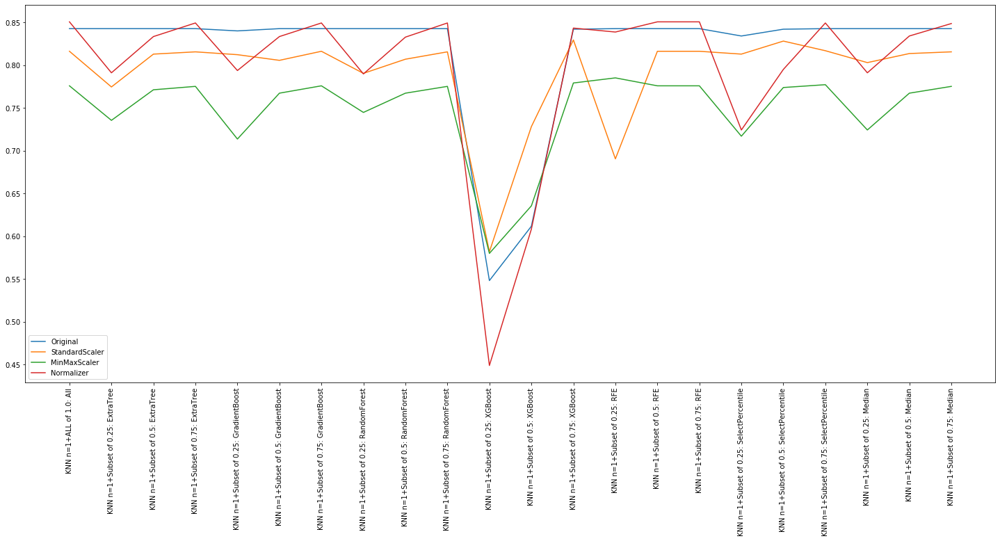

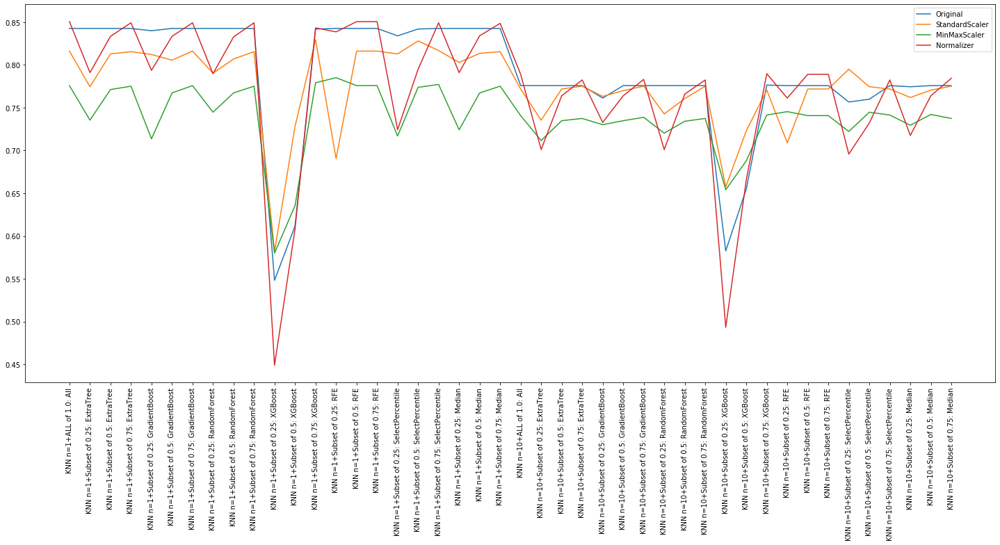

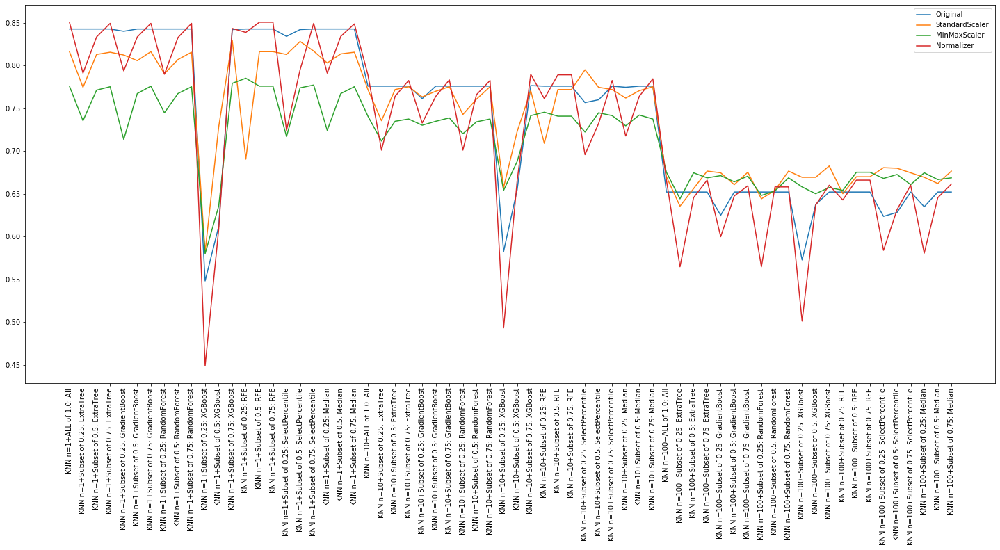

In [29]:
from sklearn.neighbors import KNeighborsClassifier

neighborsNum = [1, 10, 100]
for n in neighborsNum:
    runModel(KNeighborsClassifier(n_jobs=-1,n_neighbors=n), 'KNN n=%s' %n)
    showPlot()    

Note that for KNN:
- The model performs the best when the number of neighbours is set to 1. 
- The original dataset without transformations performs well consistently. However, ocassionally it is out-performed by other transformations.
- The best performance for KNN is around 0.85-0.86 score/accuracy.

### Naïve Bayes

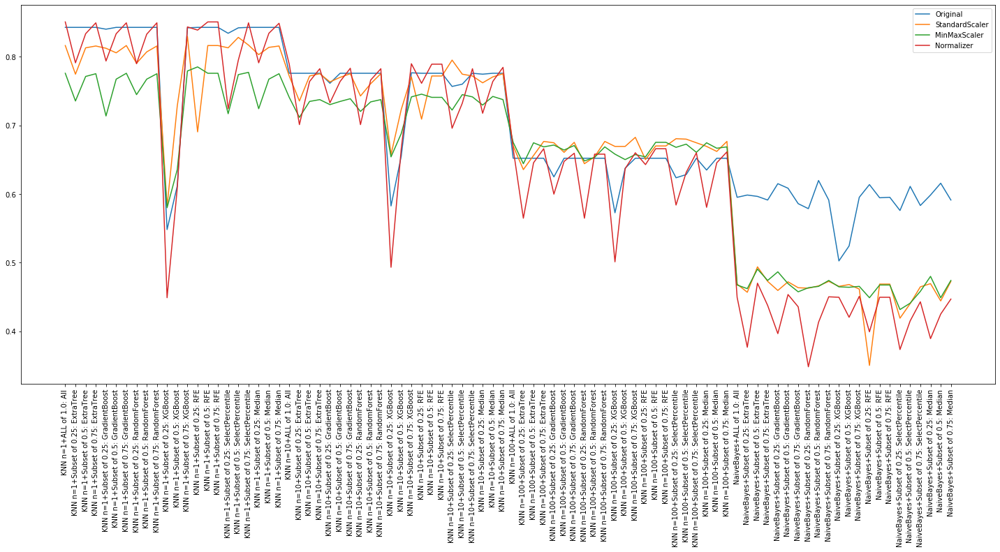

In [30]:
from sklearn.naive_bayes import GaussianNB

runModel(GaussianNB(), 'NaiveBayes')
showPlot()

Note for Naïve Bayes:
- The original dataset without transformation out-performs all transformations
- The best performance is around 0.6-0.65 accuracy/score. 
- Currently, KNN is still the best-performing model (0.85-0.86).

Now, transfer the current accuracies data into the main dictionary.

In [31]:
for key in accuracies.keys():
    accuraciesTotal[key].extend(accuracies[key])
xtickLstTotal.extend(xtickLst)

xtickLst = []
accuracies = {}
for transform in transformationLst:
    accuracies[transform]=[]
    accuracies[transform + ' Record'] = []

### Decision Tree

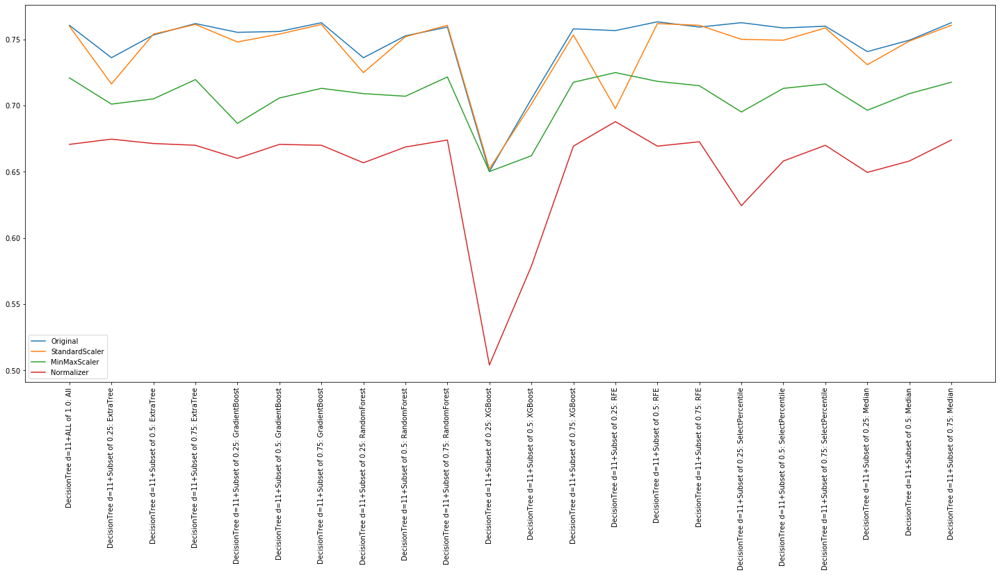

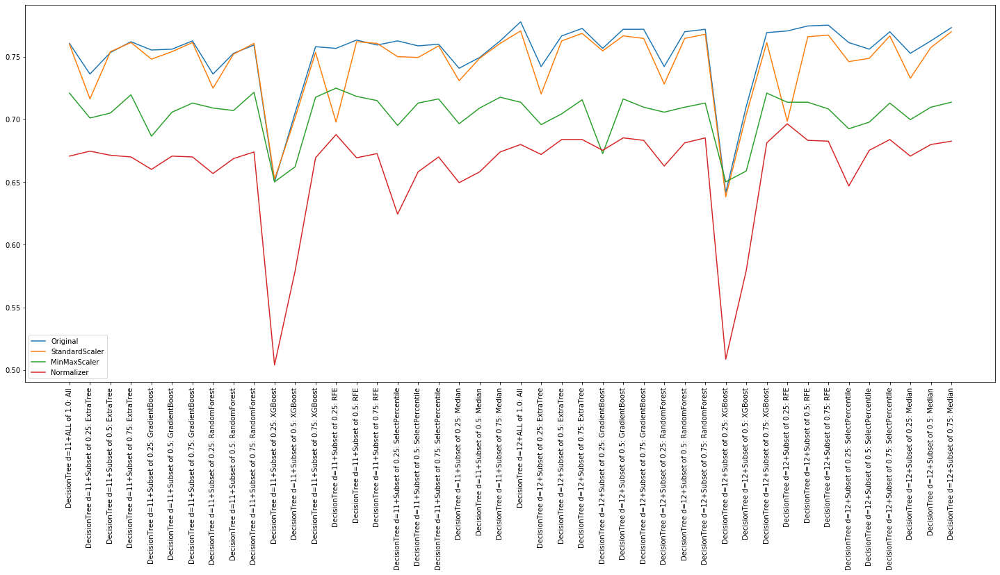

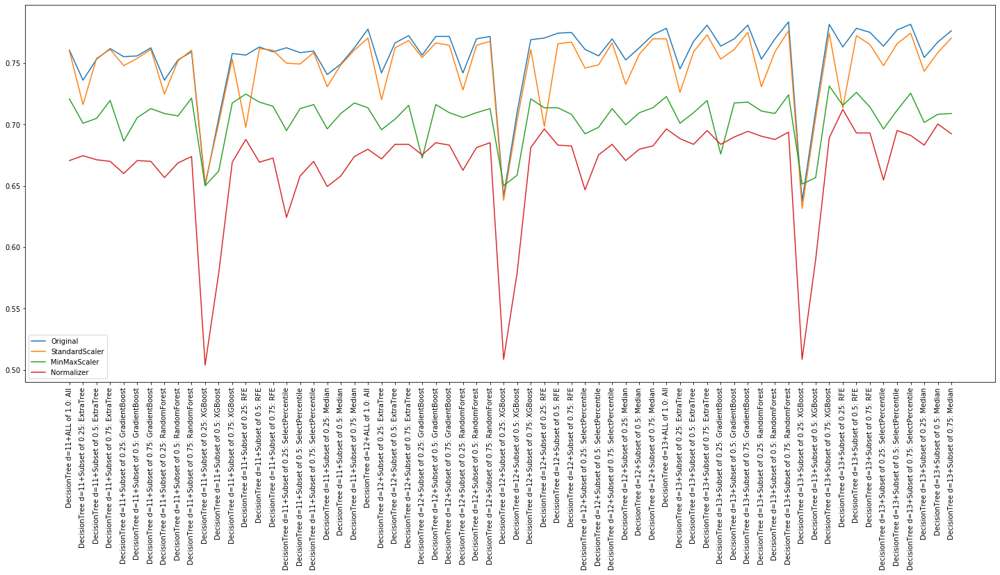

In [32]:
from sklearn.tree import DecisionTreeClassifier

depthLst = [11, 12, 13]

for depth in depthLst:
    runModel(DecisionTreeClassifier(random_state=0, max_depth=depth), 'DecisionTree d=%s' %depth)
    showPlot()

Note for Decision Tree:
- All depth performs roughly the same, with depth = 13 performing generally the best.
- Original data out-performes any transformed data.
- The best performance of Decision Tree is around 0.77-0.78. Currently the best performing model is KNN.

### Support Vector Machines (SVM)

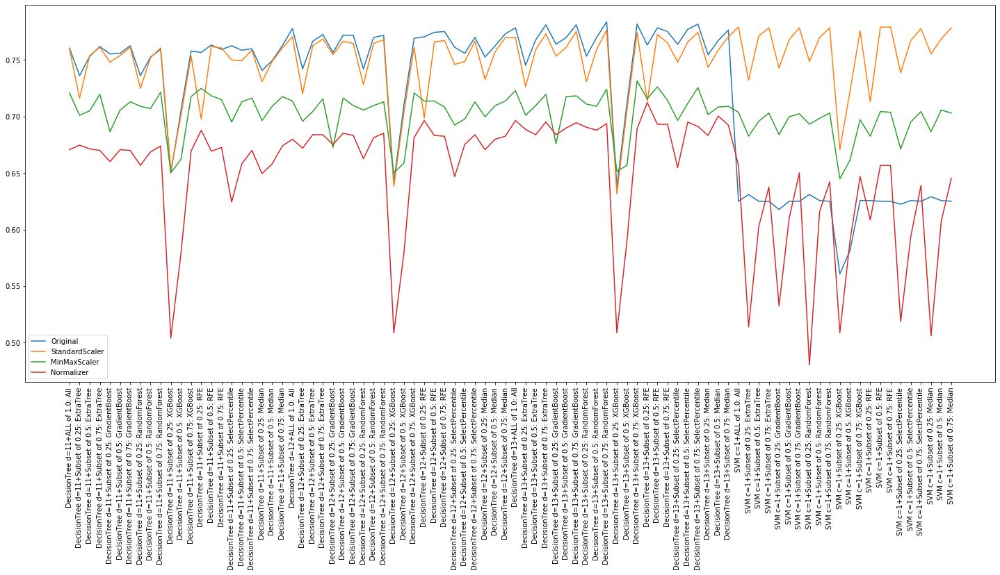

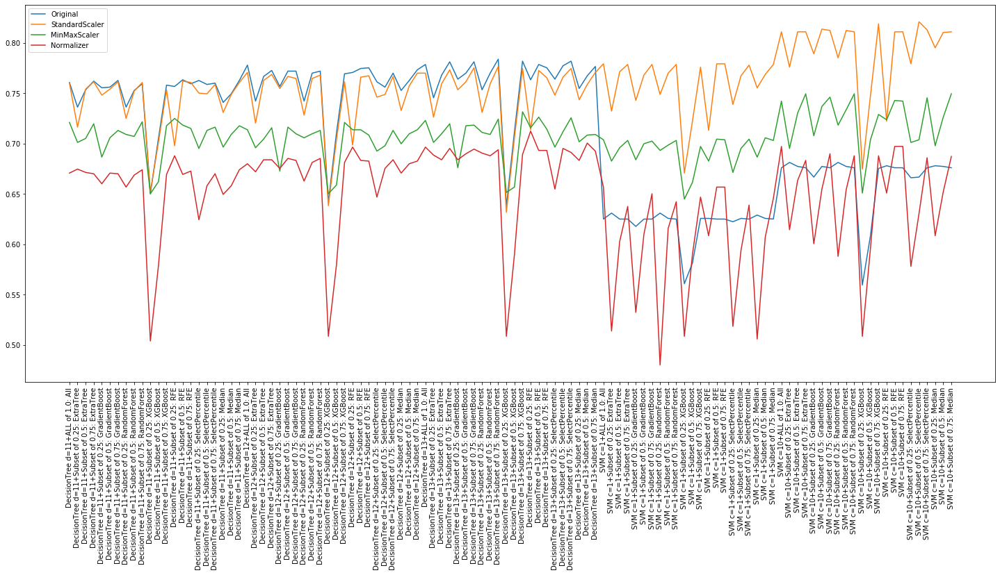

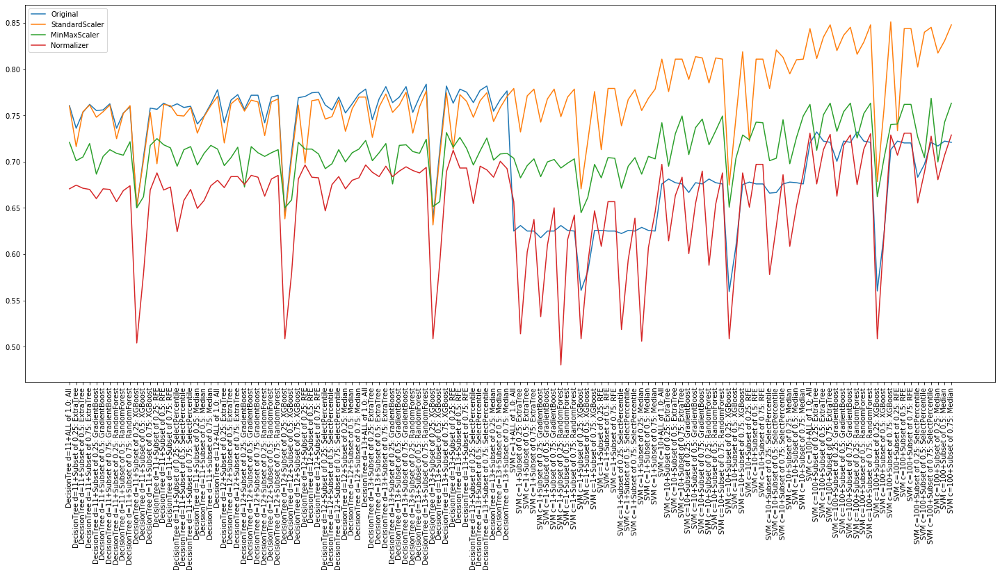

In [33]:
from sklearn.svm import SVC

regularizationLst = [1, 10, 100]
for regularization in regularizationLst:
    runModel(SVC(random_state=0, C=regularization), 'SVM c=%s' %regularization)
    showPlot()

Note for Support Vector Machine:
- The standard scalar transformation out-performs all other transformations and the original dataset.
- The best performance is around 0.85 accuracy/score. 
- This performance is similar to that of our current best-performing model (KNN).
- Training time is siginificantly longer as SVM stores the kernel matrix in memory, and there is a quadratic relationship between the number of data points and the memory used.

Again, transfer the current accuracies data into the main dictionary.

In [34]:
for key in accuracies.keys():
    accuraciesTotal[key].extend(accuracies[key])
xtickLstTotal.extend(xtickLst)

xtickLst = []
accuracies = {}
for transform in transformationLst:
    accuracies[transform]=[]
    accuracies[transform + ' Record'] = []

### Random Forest

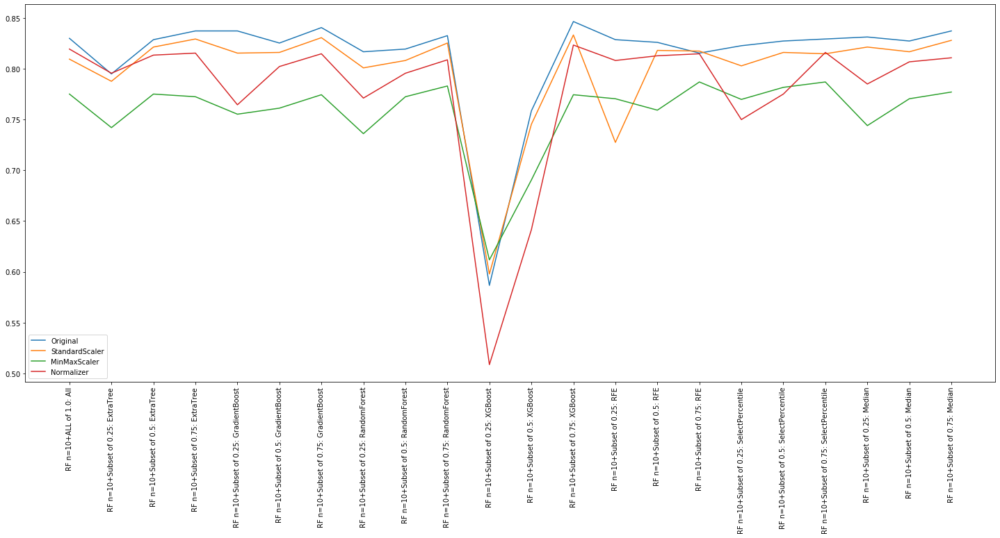

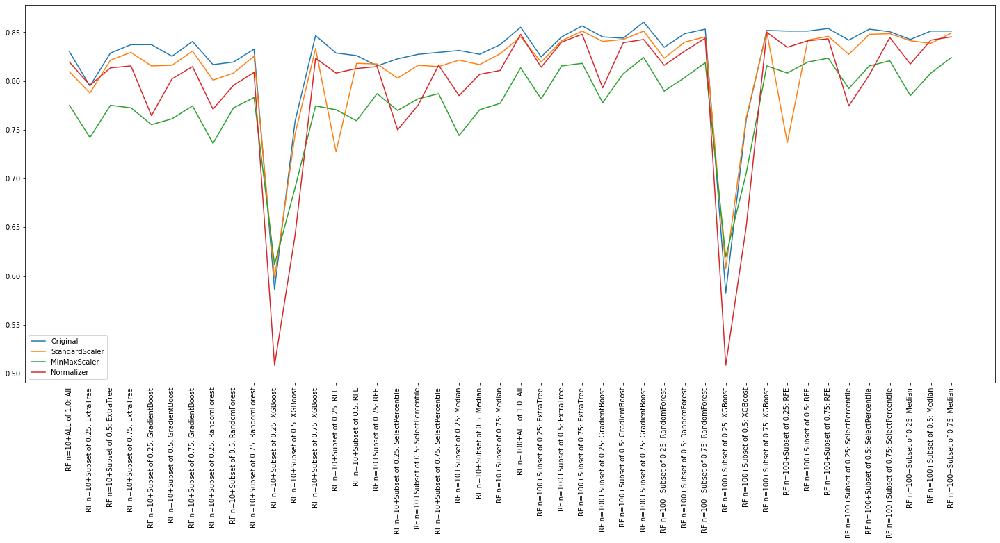

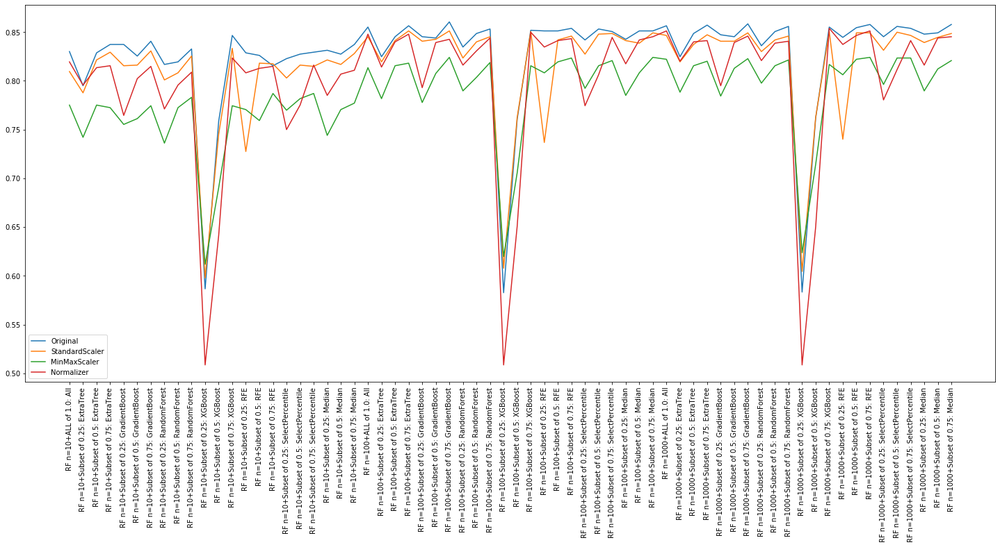

In [35]:
from sklearn.ensemble import RandomForestClassifier

estimatorNum = [10, 100, 1000]
for estimator in estimatorNum:
    runModel(RandomForestClassifier(n_jobs=-1, n_estimators=estimator, random_state=0), 'RF n=%s' %estimator)
    showPlot()

Note for Random Forest:
- All three estimator number chosen perform similarly.
- The original dataset without transformation out-performs all transformations
- The best performance is around 0.85 accuracy/score, which is similar to that of the best performing model (KNN/SVM).

### Extra Tree

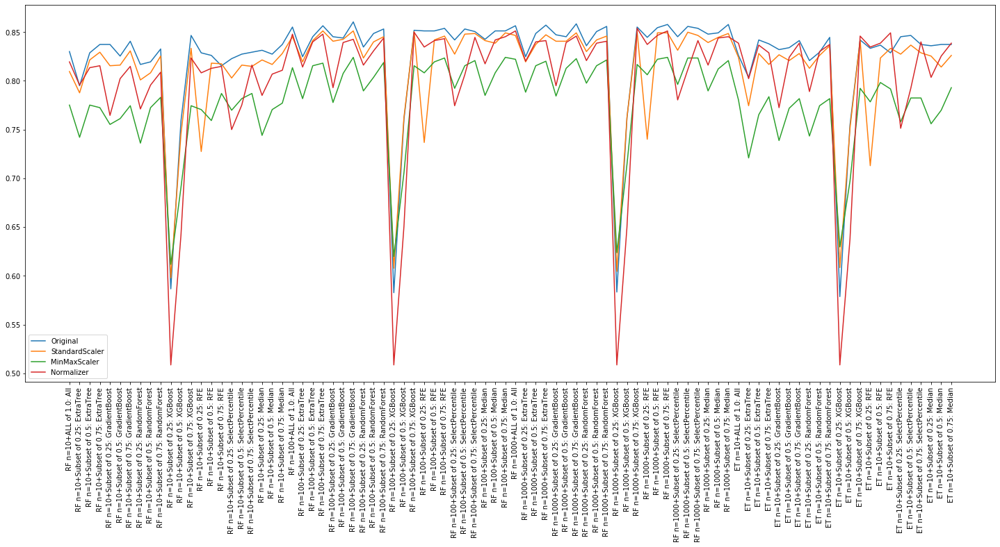

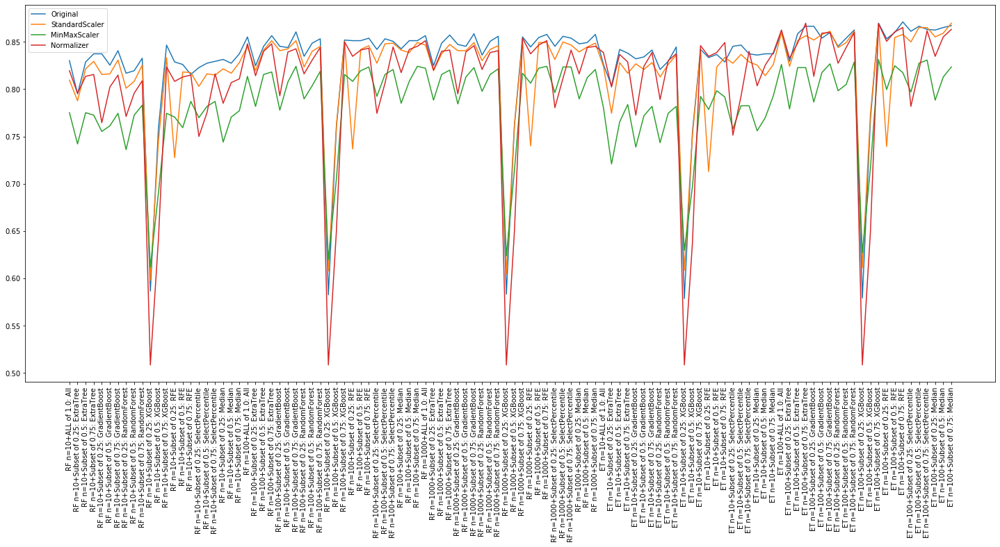

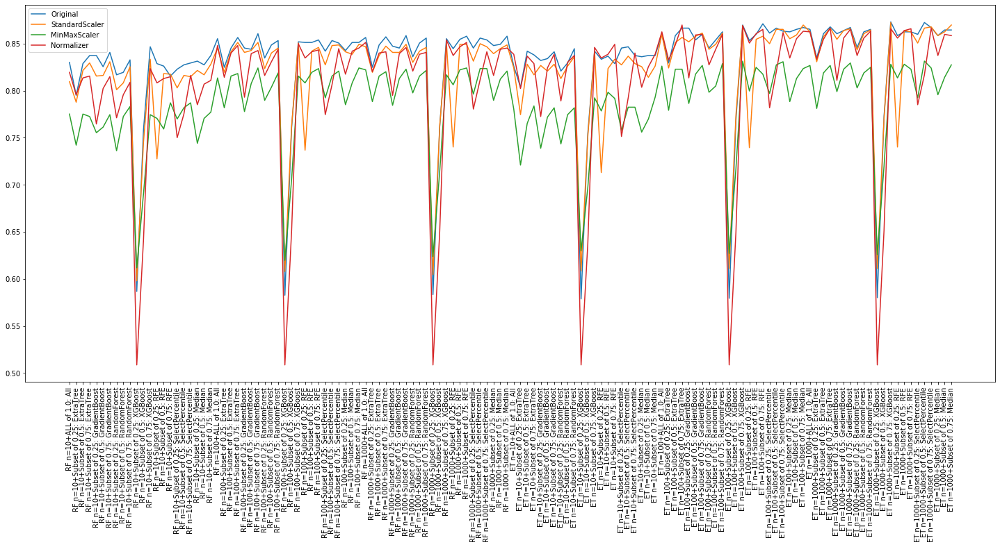

In [36]:
from sklearn.ensemble import ExtraTreesClassifier

estimatorNum = [10, 100, 1000]
for estimator in estimatorNum:
    runModel(ExtraTreesClassifier(n_jobs=-1,n_estimators=estimator, random_state=0), 'ET n=%s' %estimator)
    showPlot()

Note that for Extra Tree:
- The model performs the best when the number of estimators is set to be 1000.
- The original dataset without transformations performs well consistently.
- The best performance for Extra Tree is around 0.87-0.88 score/accuracy. Therefore, the current best-performing model is Extra Tree.

Again, transfer the current accuracies data into the main dictionary.

In [37]:
for key in accuracies.keys():
    accuraciesTotal[key].extend(accuracies[key])
xtickLstTotal.extend(xtickLst)

xtickLst = []
accuracies = {}
for transform in transformationLst:
    accuracies[transform]=[]
    accuracies[transform + ' Record'] = []

### AdaBoost

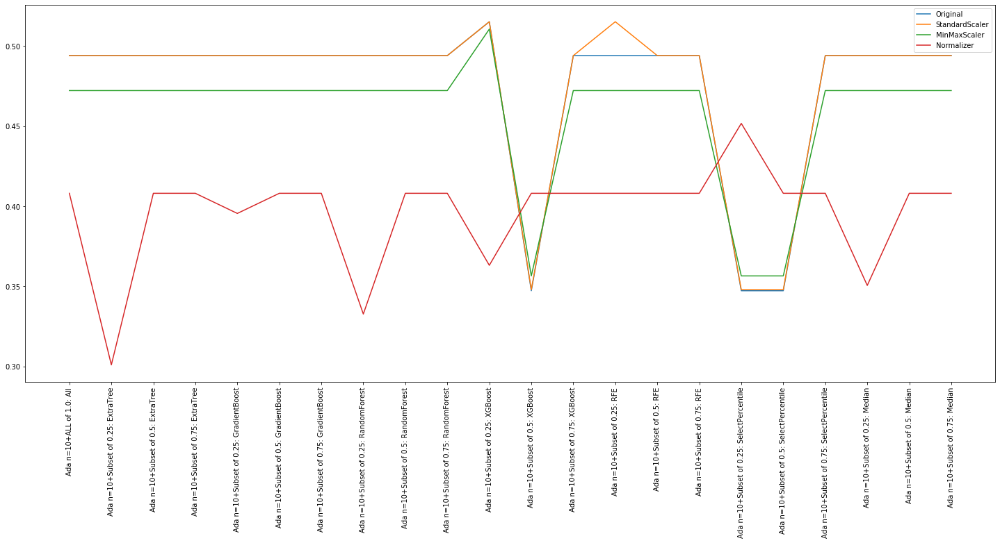

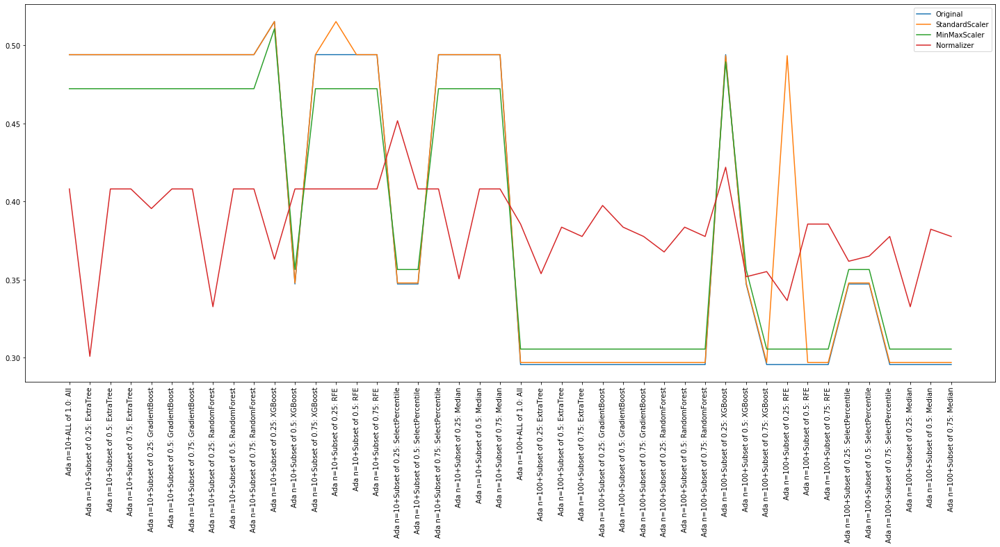

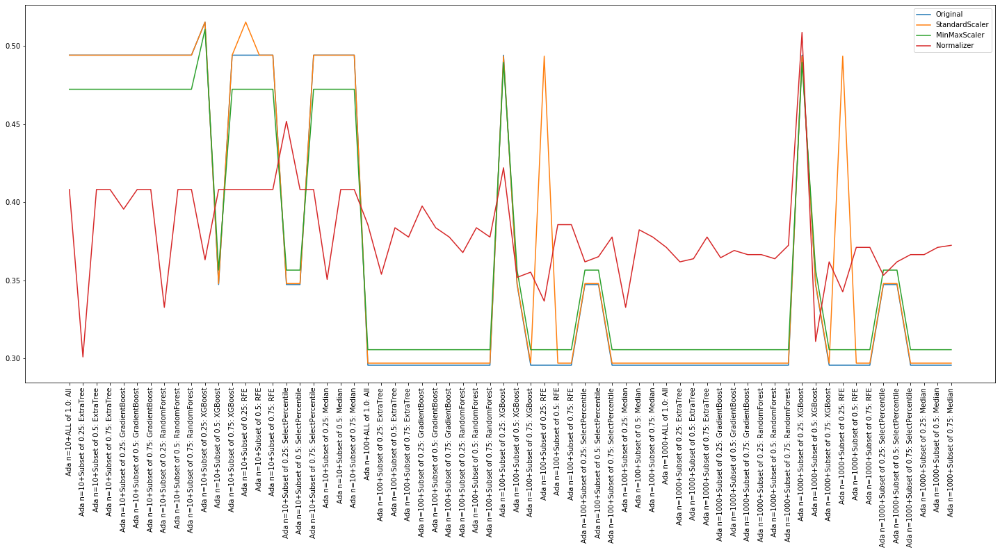

In [38]:
from sklearn.ensemble import AdaBoostClassifier

estimatorNum = [10, 100, 1000]
for estimator in estimatorNum:
    runModel(AdaBoostClassifier(n_estimators=estimator, random_state=0), 'Ada n=%s' %estimator)
    showPlot()

Note that for AdaBoost:
- The model generally performs very poor comparing to other models. The best performance is around 0.50-0.55 score/accuracy.
- Dataset transformed by standardScalar generally performs better than other transformations.

### Voting Classifier

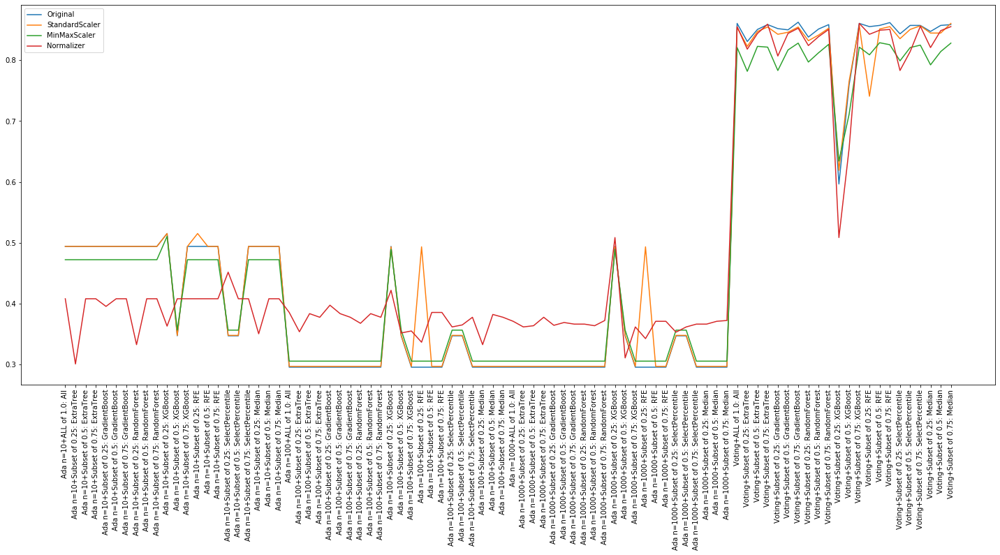

In [39]:
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

estimators = []

# Extra Tree
et = ExtraTreesClassifier(n_jobs=-1, n_estimators=100, random_state=0)
estimators.append(('et', et))

# Random Forest
rf = RandomForestClassifier(n_jobs=-1, n_estimators=100, random_state=0)
estimators.append(('rf', rf))

# Bagging
bag = BaggingClassifier(n_jobs=-1, base_estimator=DecisionTreeClassifier(random_state=0, max_depth=13),
                        n_estimators=100, random_state=0)
estimators.append(('bag', bag))

# Run voting model
runModel(VotingClassifier(estimators=estimators, n_jobs=-1), 'Voting')
showPlot()

Note that for Voting:
- The model votes on three possible classifiers: Extra Tree, Random Forest, and Bagging Classifier. This Sklearn algorithm will choose to use the best unfit classifier to predict the test data.
- performs the best when data is not transformed.
- The best performance for Voting is around 0.80-0.85 score/accuracy. Therefore, the current best-performing model is still Extra Tree.

### XGBoost

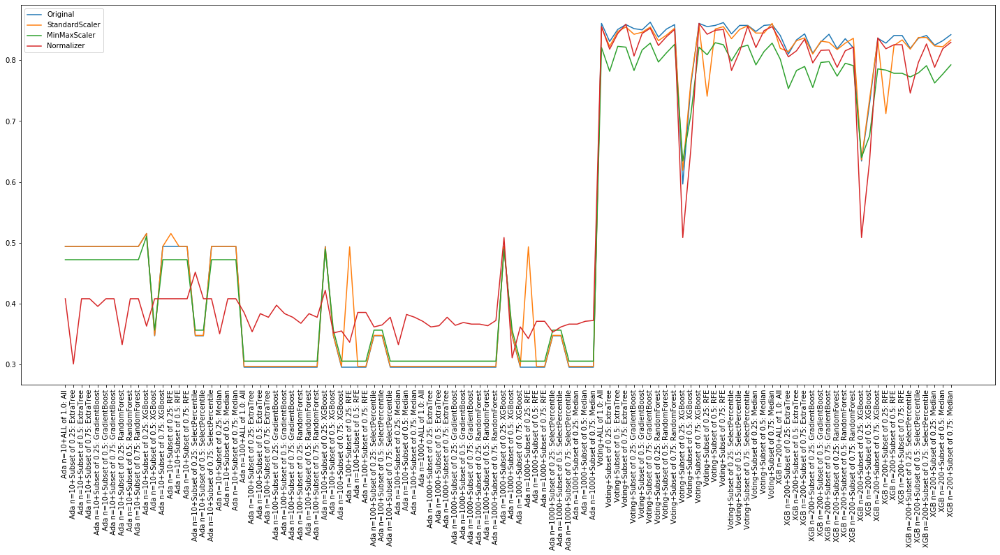

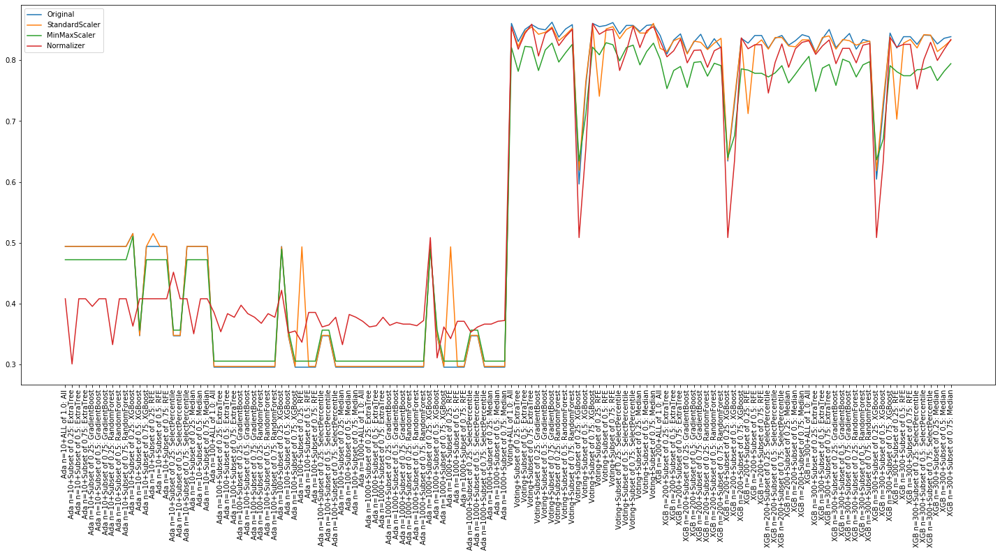

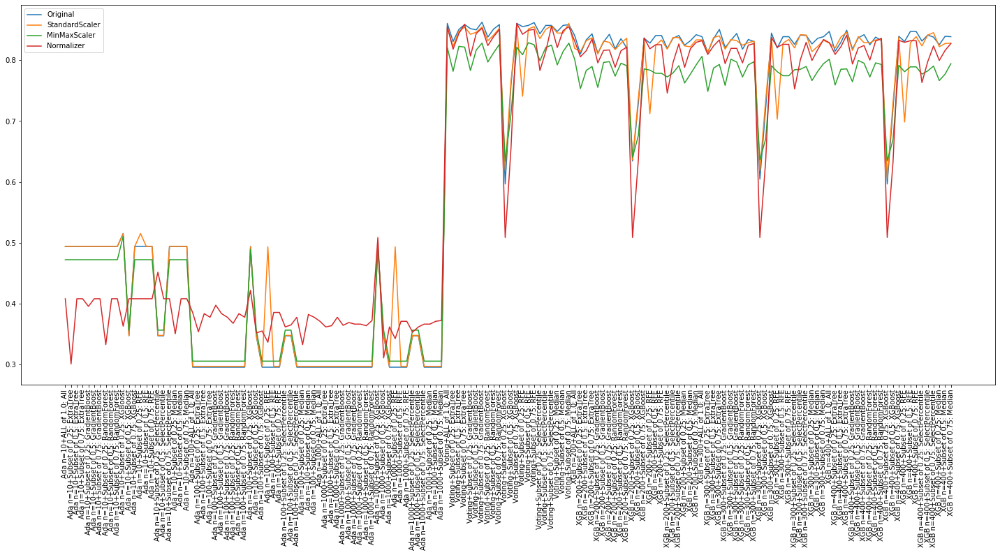

In [40]:
from xgboost import XGBClassifier

estimatorNum = [200, 300, 400]
for estimator in estimatorNum:
    runModel(XGBClassifier(n_estimators=estimator, seed=0, subsample=0.25), 'XGB n=%s' %estimator)
    showPlot()

Note that for XGBoost:
- The model performs the best when the number of estimators is set to be 300.
- The original dataset without transformations performs well consistently.
- The best performance for XGBoost is around 0.80-0.85 score/accuracy. Therefore, the current best-performing model is still Extra Tree.

Again, transfer the current accuracies data into the main dictionary.

In [41]:
for key in accuracies.keys():
    accuraciesTotal[key].extend(accuracies[key])
xtickLstTotal.extend(xtickLst)

xtickLst = []
accuracies = {}
for transform in transformationLst:
    accuracies[transform]=[]
    accuracies[transform + ' Record'] = []

### Artificial Neural Network (ANN)

In order to search for the best performing ANN model, 5 ANN models are created:
- baseline: a 2-layer model.
- smallNN: a 2-layer model with half nodes.
- deepNN: a 3-layer model.
- deepNNDropout: Added dropout layers to the 3-layer model.
- baselineDecay: Added decay to the baseline model.

After constructing the models, each model is used to predict the forest cover type, and their accuracies are recorded accordingly.

Using TensorFlow backend.


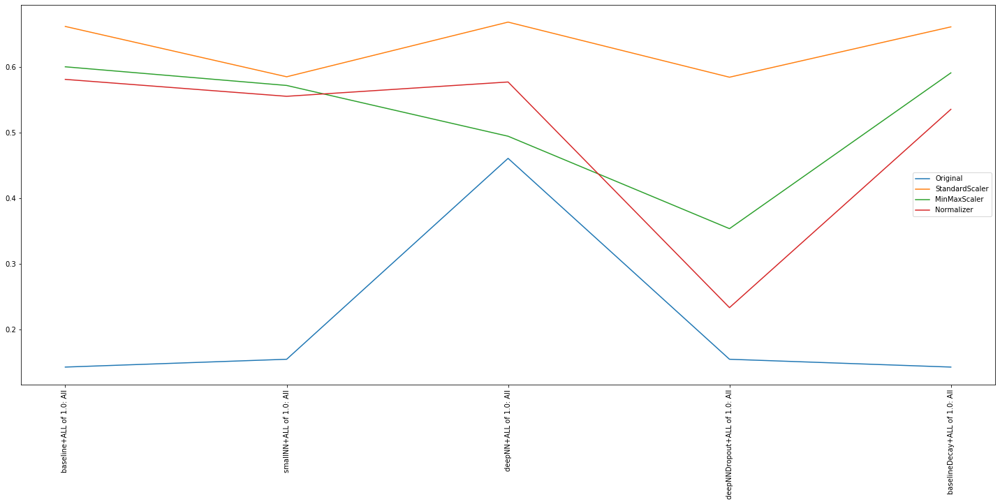

In [42]:
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import np_utils

from sklearn.preprocessing import LabelEncoder

from keras.optimizers import SGD
from keras.layers import Dropout
from keras.constraints import maxnorm

outputNum = 7
np.random.seed(0)

# Hot encode the data before usage
encoder = LabelEncoder()
y_train_encoded = encoder.fit_transform(y_train)
y_train_hot = np_utils.to_categorical(y_train_encoded, outputNum) 
y_test_encoded = encoder.fit_transform(y_test)
y_test_hot = np_utils.to_categorical(y_test_encoded, outputNum) 

# baseline model, compiled using Adam optimizer. 2 layers.
def baseline(v):
    model = Sequential()
    model.add(Dense(int(v*(c-1)), input_dim=int(v*(c-1)), init='normal', activation='relu'))
    model.add(Dense(7, init='normal', activation='sigmoid'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

# define small model, compiled using Adam optimizer. 2 layers.
def smallNN(v):
    model = Sequential()
    model.add(Dense(int(v*(c-1)/2), input_dim=int(v*(c-1)), init='normal', activation='relu'))
    model.add(Dense(7, init='normal', activation='sigmoid'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

# define deep model, compiled using Adam optimizer. 3 layers.
def deepNN(v):
    model = Sequential()
    model.add(Dense(int(v*(c-1)), input_dim=int(v*(c-1)), init='normal', activation='relu'))
    model.add(Dense(int(v*(c-1)/2), init='normal', activation='relu'))
    model.add(Dense(7, init='normal', activation='sigmoid'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

# Optimized model using dropout. 3 layers + 2 dropouts
def deepNNDropout(v):
    model = Sequential()
    model.add(Dense(int(v*(c-1)), input_dim=int(v*(c-1)), init='normal', activation='relu',W_constraint=maxnorm(3)))
    model.add(Dropout(0.2))
    model.add(Dense(int(v*(c-1)/2), init='normal', activation='relu', W_constraint=maxnorm(3)))
    model.add(Dropout(0.2))
    model.add(Dense(7, init='normal', activation='sigmoid'))
    sgd = SGD(lr=0.1,momentum=0.9,decay=0.0,nesterov=False)
    model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
    return model

# Optimized model using decay. 2 layers + decay 0.01
def baselineDecay(v):
    model = Sequential()
    model.add(Dense(int(v*(c-1)), input_dim=int(v*(c-1)), init='normal', activation='relu'))
    model.add(Dense(7, init='normal', activation='sigmoid'))
    sgd = SGD(lr=0.1,momentum=0.8,decay=0.01,nesterov=False)
    model.compile(loss='categorical_crossentropy', optimizer=sgd, metrics=['accuracy'])
    return model
    
modelLst = [('baseline',baseline),('smallNN',smallNN),('deepNN',deepNN),
            ('deepNNDropout',deepNNDropout),('baselineDecay',baselineDecay)]

for nnName, nnModel in modelLst:
    
    for transform, name, XTrain, XTest, ratio, featSelected, featRemoved, featRank, featSelectedIdx, featRemovedIdx in featureLst:
        model = KerasClassifier(build_fn=nnModel, v=ratio, nb_epoch=10, verbose=0)
        model.fit(XTrain[:,featSelectedIdx],y_train_hot)
        result = model.score(XTest[:,featSelectedIdx], y_test_hot)
        accuracies[transform].append(result)
        xtickLst.append("%s+ALL of %s: %s" % (nnName, ratio, name))

showPlot()

Note that for the set of ANN models:
- The model performs the best when there are 3 layers and without any optimization of dropout layers or decaying.
- The StandardScalar transformation performs the best.
- The best performance for ANNs is around 0.6-0.7 score/accuracy. Therefore, the current best-performing model is still Extra Tree.

Again, transfer the current accuracies data into the main dictionary.

### Summary of Models

After attempting a variety of models, their prediction accuracies are stored in the "accuraciesTotal" dictionary. In the following, all the accuracies data is displayed to compare the model results graphically.

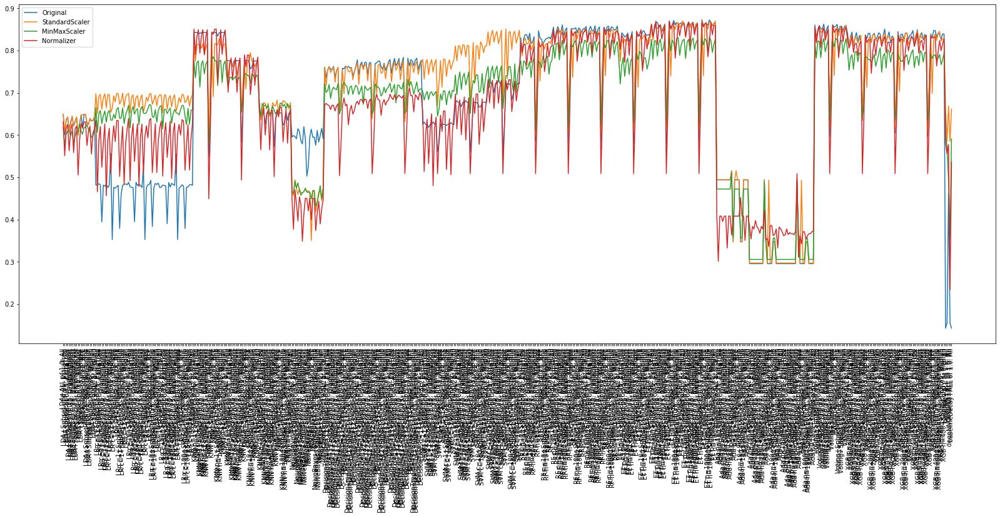

In [43]:
for key in accuracies.keys():
    accuraciesTotal[key].extend(accuracies[key])
xtickLstTotal.extend(xtickLst)

plt.rc("figure", figsize=(28, 10))
    
fig, ax = plt.subplots()
for transform in transformationLst:
       plt.plot(accuraciesTotal[transform])

# Get unique values in all xticks while preserving order.
ticks = [x for i, x in enumerate(xtickLstTotal) if i == xtickLstTotal.index(x)]
ax.set_xticks(range(len(ticks)))
ax.set_xticklabels(ticks, rotation='vertical')
plt.legend(transformationLst,loc='best')    

plt.show()

Therefore, the best performing model is one of the Extra Tree classifiers, or the Voting Classifier. In the following, the best performing model with the highest accuracy is determined programmatically.

In [44]:
globalMax = 0
globalMaxIdx = -1
globalMaxTransName = ''
for group in accuraciesTotal.items():
    if (len(group[0].split(' ')) == 1):
        for i, acc in enumerate(group[1]):
            if globalMax < acc:
                globalMax = acc
                globalMaxIdx = i
                globalMaxTransName = accuraciesTotal[group[0] + ' Record'][i]
print(globalMax)
print(globalMaxIdx)
print(globalMaxTransName)

0.873015873015873
430
ET n=1000+Subset of 0.75: XGBoost


Therefore, it is determined that the best-performing model is *Extra Tree Classifier with 1000 estimators when using 0.75 Subset of the features selected by the XGBoost classifier*. The accuracy of the best-performing model is around 87.3%. 

In the following, the best model is downloaded.

In [47]:
indexes = []
for transform, name, XTrain, XTest, ratio, featSelected, featRemoved, featRank, featSelectedIdx, featRemovedIdx in featureGroupSubsets:
    if ratio == 0.75:
        if transform == 'StandardScaler':
            indexes = featSelectedIdx
            break

# Get best model
XTrainOrig = trainDF.drop('Cover_Type', axis=1)
yTrainOrig = trainDF['Cover_Type']
best_model = ExtraTreesClassifier(n_jobs=-1, n_estimators=1000)
best_model.fit(XTrainOrig.iloc[:,indexes], yTrainOrig)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=-1,
                     oob_score=False, random_state=None, verbose=0,
                     warm_start=False)

In [48]:
# Store best model
from joblib import dump
dump(best_model, 'ForestCoverTypeAnalysis.h5')

['ForestCoverTypeAnalysis.h5']

# Conclusion

Predicting forest cover type data based on cartographic variables such as elevation, aspect, soil type and hillside shade area, has considerable siginificance in the field of agriculture, land management, city management, and natural resource industries. As an extension of Jock A. Blackard and Denis J. Dean's research in the 1990s, this project utilizes the original dataset to make prediction on the forest cover type using modern AI/ML libraries and toolsets such as Sklearn and Keras/Tensorflow. 

Specifically, for feature selection, classifiers including Extra Tree, Gradient Boost, Random Forest, XGBoost, Recursive Feature Elimiation, and Select Percentile are used, and the selected features are stored in combinations and subsets to be attempted individually by a variety of AI/ML models including Linear Discriminant, Logistic Regression, K-Nearest Neighbours, Gaussian Naïve Bayes, Decision Tree, Support Vector Machine, Random Forest, Extra Trees, AdaBoost, Bagging, Voting, XGBoost Classifier, and an ANN deep learning model. The best performing model after comparison, is *Extra Tree Classifier with 1000 estimators when using 0.75 Subset of the features selected by the XGBoost classifier*. The accuracy of the best-performing model is around 87.3%. 

Comparing with the 70%-71% accuracy of Blackard and Dean's model developed in the 1990s, the modern toolset is proven to be more accurate. The resulting model, named and stored as "ForestCoverTypeAnalysis.h5" is also proven to be a reliable model to predict forest cover type in areas of Northern Colorado with little human interference to the environment.

# Acknowledgement

This notebook is based on the instructions given by Santhosh Sharma Ananthramu on [Kaggle](https://www.kaggle.com/sharmasanthosh/exploratory-study-of-ml-algorithms). His effort and guidance is greatly appreciated.